# Figures for paper 1

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from matplotlib.colors import PowerNorm
from matplotlib.lines import Line2D
from matplotlib.transforms import Affine2D
import mpl_toolkits.axisartist.floating_axes as floating_axes

In [3]:
from Procrustes import GPA

In [4]:
from itertools import combinations

In [5]:
from sklearn.datasets import make_swiss_roll, load_digits

In [6]:
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap, MDS, TSNE, SpectralEmbedding
from umap import UMAP

/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
from sklearn.preprocessing import MultiLabelBinarizer

In [8]:
from scipy.spatial.distance import pdist, squareform
from scipy.spatial import procrustes

In [9]:
from scipy.cluster.hierarchy import linkage, leaves_list, fcluster

In [10]:
from ripser import ripser
from persim import plot_diagrams

In [11]:
import scanpy as sc

In [12]:
from tqdm import tqdm

In [13]:
import warnings

In [14]:
colorkey = dict(zip(range(1,11), sns.color_palette('tab10', 10)))

## Figure 1

In [15]:
num_points = 2000
sr1_X, sr1_t = make_swiss_roll(num_points, noise=0, random_state=42)

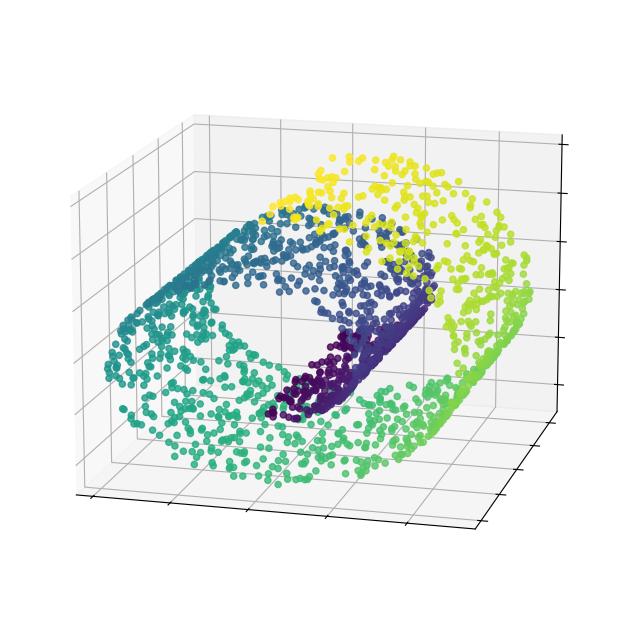

In [16]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(1,1,1, projection='3d')
ax.view_init(15,-75)
ax.dist = 8

ax.scatter(*zip(*sr1_X), c=sr1_t, s=20, alpha=0.8)

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])

# plt.tight_layout()
# plt.savefig('figures/Figure1A.png', bbox_inches='tight')
plt.show()

In [17]:
num_trials = 200
isomap = Isomap(n_components=2, n_neighbors=7)

sr1_results = list()
rng = np.random.default_rng(seed=42)
for _ in tqdm(range(num_trials)):
    X_sample = sr1_X + rng.normal(size=sr1_X.shape, scale=0.7)
    sr1_results.append(isomap.fit_transform(X_sample))

100%|██████████| 200/200 [04:23<00:00,  1.32s/it]


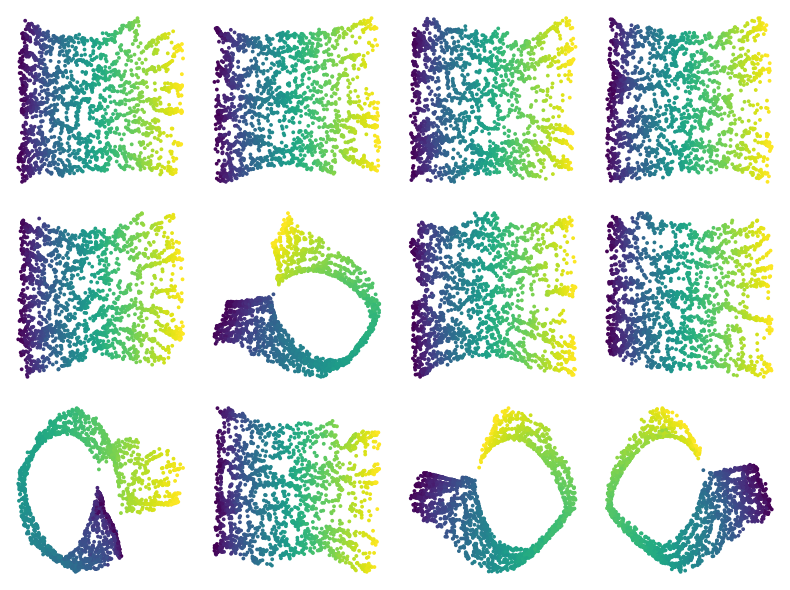

In [18]:
fig, axs = plt.subplots(3, 4, figsize=(8,6))
for i, ax in enumerate(fig.axes):
    ax.scatter(*zip(*sr1_results[i]), s=3, c=sr1_t)
    ax.axis('off')
plt.tight_layout()
# plt.savefig('figures/Figure1B.png', bbox_inches='tight')
plt.show()

In [19]:
sr1_procrustes_dist = [procrustes(x1, x2)[2] / num_points for x1, x2 in combinations(sr1_results, 2)]
sr1_procrustes_dist = squareform(sr1_procrustes_dist)

In [20]:
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
sr1_mds = mds.fit_transform(sr1_procrustes_dist)

/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


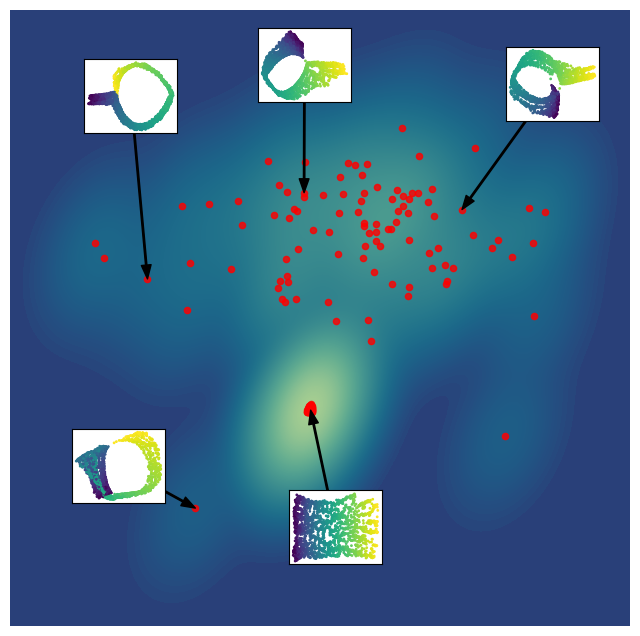

In [21]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=sr1_mds[:,0], y=sr1_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=1000, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*sr1_mds), s=20, alpha=0.8, c='red')

mini_axs = dict()
inset_axis_width = 0.15
inset_axis_height = 0.12

i = 0
inset_x = 0.45
inset_y = 0.10
mini_axs[i] = ax.inset_axes([inset_x, inset_y, inset_axis_width, inset_axis_height], transform=ax.transAxes)
mini_axs[i].scatter(*zip(*sr1_results[i]), s=1, c=sr1_t)
mini_axs[i].set_xticks([])
mini_axs[i].set_yticks([])
ax.annotate('', xy=sr1_mds[i], xytext=(inset_x + inset_axis_width / 2, inset_y + inset_axis_height / 2), xycoords='data', textcoords='axes fraction', arrowprops=dict(facecolor='black', width=1, headwidth=7, headlength=10))

i = 133
inset_x = 0.1
inset_y = 0.2
mini_axs[i] = ax.inset_axes([inset_x, inset_y, inset_axis_width, inset_axis_height], transform=ax.transAxes)
mini_axs[i].scatter(*zip(*sr1_results[i]), s=1, c=sr1_t)
mini_axs[i].set_xticks([])
mini_axs[i].set_yticks([])
ax.annotate('', xy=sr1_mds[i], xytext=(inset_x + inset_axis_width / 2, inset_y + inset_axis_height / 2), xycoords='data', textcoords='axes fraction', arrowprops=dict(facecolor='black', width=1, headwidth=7, headlength=10))

i = 50
inset_x = 0.12
inset_y = 0.8
mini_axs[i] = ax.inset_axes([inset_x, inset_y, inset_axis_width, inset_axis_height], transform=ax.transAxes)
mini_axs[i].scatter(*zip(*sr1_results[i]), s=1, c=sr1_t)
mini_axs[i].set_xticks([])
mini_axs[i].set_yticks([])
ax.annotate('', xy=sr1_mds[i], xytext=(inset_x + inset_axis_width / 2, inset_y + inset_axis_height / 2), xycoords='data', textcoords='axes fraction', arrowprops=dict(facecolor='black', width=1, headwidth=7, headlength=10))

i = 63
inset_x = 0.4
inset_y = 0.85
mini_axs[i] = ax.inset_axes([inset_x, inset_y, inset_axis_width, inset_axis_height], transform=ax.transAxes)
mini_axs[i].scatter(*zip(*sr1_results[i]), s=1, c=sr1_t)
mini_axs[i].set_xticks([])
mini_axs[i].set_yticks([])
ax.annotate('', xy=sr1_mds[i], xytext=(inset_x + inset_axis_width / 2, inset_y + inset_axis_height / 2), xycoords='data', textcoords='axes fraction', arrowprops=dict(facecolor='black', width=1, headwidth=7, headlength=10))

i = 36
inset_x = 0.8
inset_y = 0.82
mini_axs[i] = ax.inset_axes([inset_x, inset_y, inset_axis_width, inset_axis_height], transform=ax.transAxes)
mini_axs[i].scatter(*zip(*sr1_results[i]), s=1, c=sr1_t)
mini_axs[i].set_xticks([])
mini_axs[i].set_yticks([])
ax.annotate('', xy=sr1_mds[i], xytext=(inset_x + inset_axis_width / 2, inset_y + inset_axis_height / 2), xycoords='data', textcoords='axes fraction', arrowprops=dict(facecolor='black', width=1, headwidth=7, headlength=10))

ax.axis('off')

# plt.savefig('figures/Figure1C.png', bbox_inches='tight')
plt.show()

In [22]:
d_link = linkage(squareform(sr1_procrustes_dist), method='complete', optimal_ordering=True)
leaves_order = leaves_list(d_link)

In [23]:
sr1_clusters = fcluster(d_link, t=4, criterion='maxclust')

In [24]:
row_colors = [colorkey.get(c, 'grey') for c in sr1_clusters]

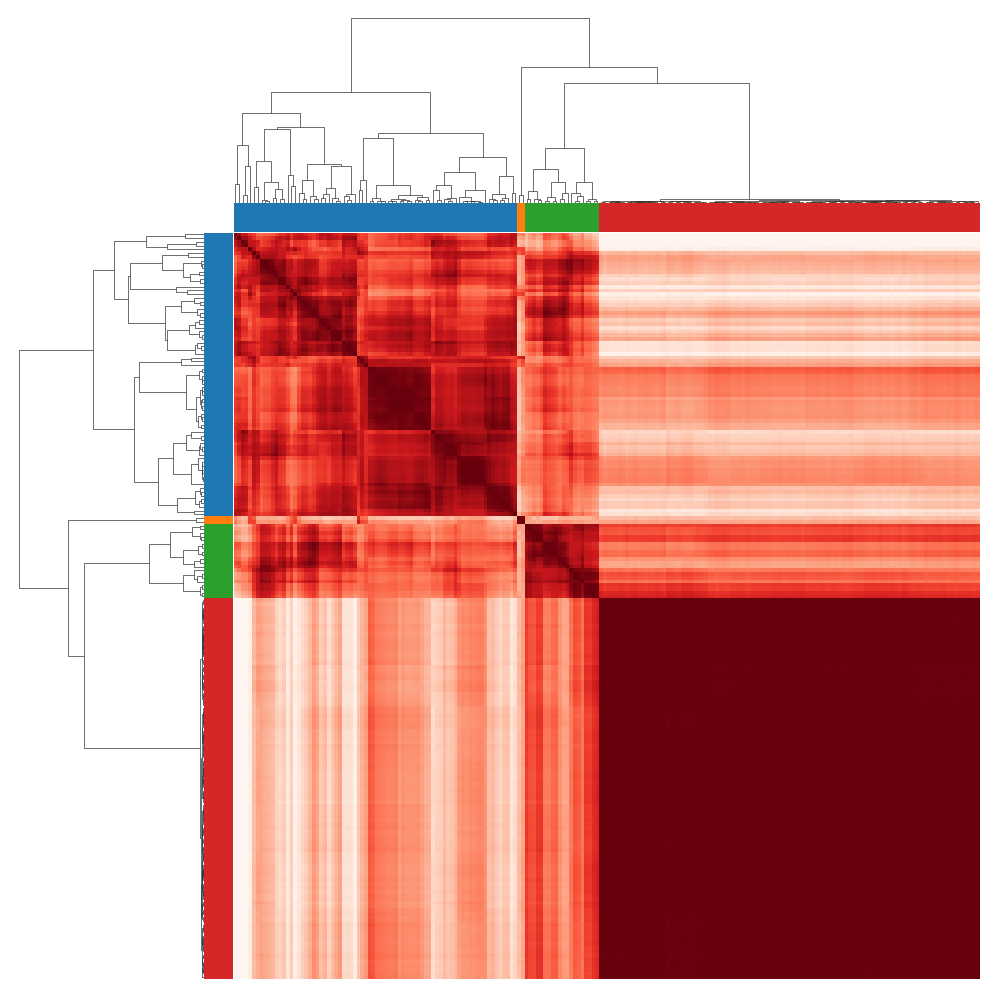

In [25]:
sns.clustermap(pd.DataFrame(sr1_procrustes_dist), row_linkage=d_link, col_linkage=d_link, row_colors=row_colors, col_colors=row_colors, cmap='Reds_r', robust=True, cbar_pos=None, xticklabels=False, yticklabels=False)
plt.show()

In [26]:
sr1_gpa = GPA(centering=True, verbose=True)
sr1_gpa_Z = sr1_gpa.fit_transform(np.array(sr1_results)[sr1_clusters == 4])

iteration 1: loss = 1.305249
iteration 2: loss = 1.305057
iteration 3: loss = 1.305057


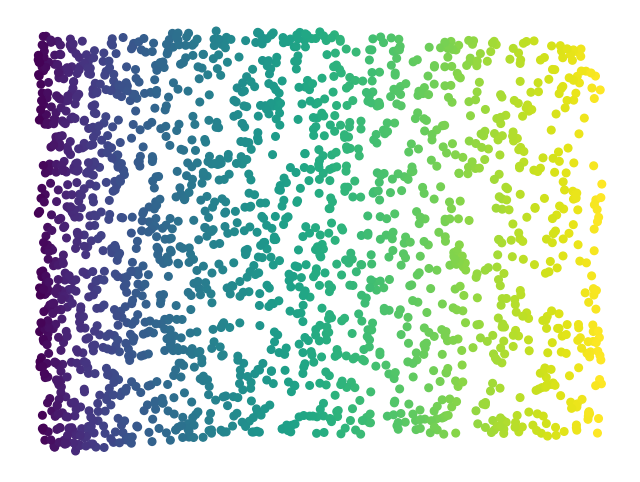

In [27]:
plt.figure(figsize=(8,6))
plt.scatter(*zip(*sr1_gpa.Z), c=sr1_t, s=30)
plt.axis('off')
# plt.savefig('figures/Figure1D.png', bbox_inches='tight')
plt.show()

## Figure 2

In [28]:
# Generate coordinates of buckyball
def all_signs(x, y, z):
    xs = [x, -x]
    ys = [y, -y]
    zs = [z, -z]

    return ([(x, y, z) for x in xs for y in ys for z in zs])

def all_cycles(x, y, z):
    return [(x, y, z), (y, z, x), (z, x, y)]

phi = (1 + np.sqrt(5)) / 2
vertices = set()
for u in [[0, 1, 3 * phi], [1, 2 + phi, 2 * phi], [phi, 2, 2 * phi + 1]]:
    for v in all_signs(*u):
        for w in all_cycles(*v):
            vertices.add(w)

In [29]:
bb_X = np.array([list(v) for v in vertices])
bb_t = np.arctan2(bb_X[:, 0], bb_X[:, 1])

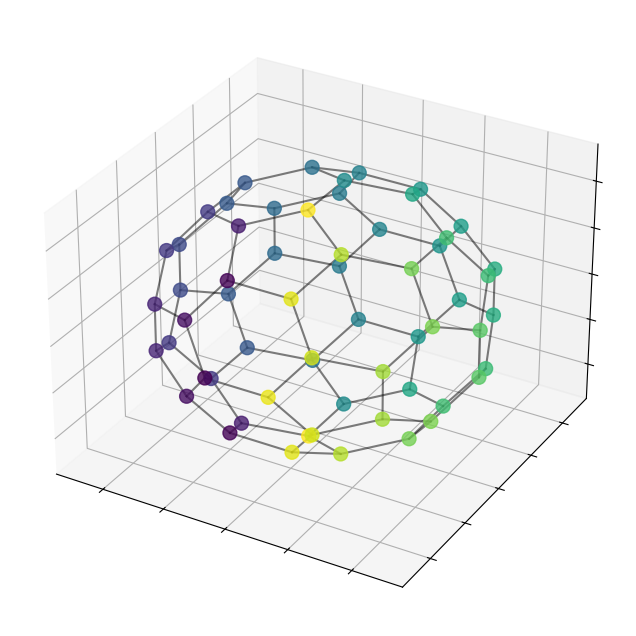

In [30]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(1,1,1, projection='3d')

ax.scatter(*zip(*bb_X), c=bb_t, s=100, alpha=0.8)

for i, j in combinations(bb_X, 2):
    if np.linalg.norm(i - j) <= 2:
        ax.plot(*zip(*[i, j]), c='k', alpha=0.5, zorder=-1)

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])

# plt.tight_layout()
# plt.savefig('figures/Figure2A.png', bbox_inches='tight')
plt.show()

In [31]:
num_trials = 500
rng = np.random.default_rng(seed=42)

bb_results = []
for _ in tqdm(range(num_trials)):
    bb_noisy = bb_X + rng.normal(scale=0.01, size=bb_X.shape)
    bb_results.append(isomap.fit_transform(bb_noisy))

  0%|          | 0/500 [00:00<?, ?it/s]

100%|██████████| 500/500 [00:01<00:00, 367.06it/s]


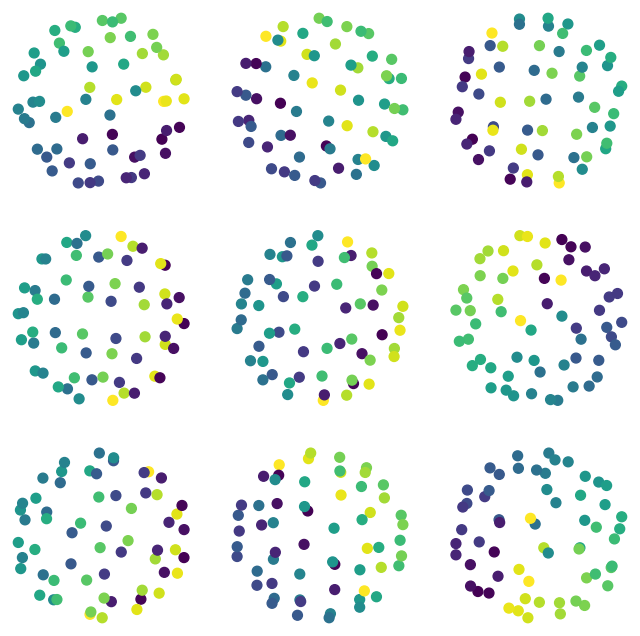

In [32]:
fig, axs = plt.subplots(3, 3, figsize=(8,8))
for i, ax in enumerate(fig.axes):
    ax.scatter(*zip(*bb_results[i]), c=bb_t, s=50)
    ax.axis('off')
# plt.tight_layout()
# plt.savefig('figures/Figure2B.png', bbox_inches='tight')
plt.show()

In [33]:
bb_procrustes_dist = []
for x1, x2 in tqdm(combinations(bb_results, 2)):
    bb_procrustes_dist.append(np.sqrt(procrustes(x1, x2)[2]))
    
bb_procrustes_dist = squareform(bb_procrustes_dist)

124750it [00:13, 9298.11it/s]


In [34]:
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
bb_mds = mds.fit_transform(bb_procrustes_dist)

/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


In [35]:
pts_to_annotate = [np.argmin((np.mod(np.arctan2(*zip(*bb_mds)) + 0.09, 2 * np.pi) - i * 2 * np.pi/7)** 2) for i in range(7)]

In [36]:
bb_aligned_embs = {i : procrustes(bb_results[0], bb_results[i])[1] for i in pts_to_annotate}

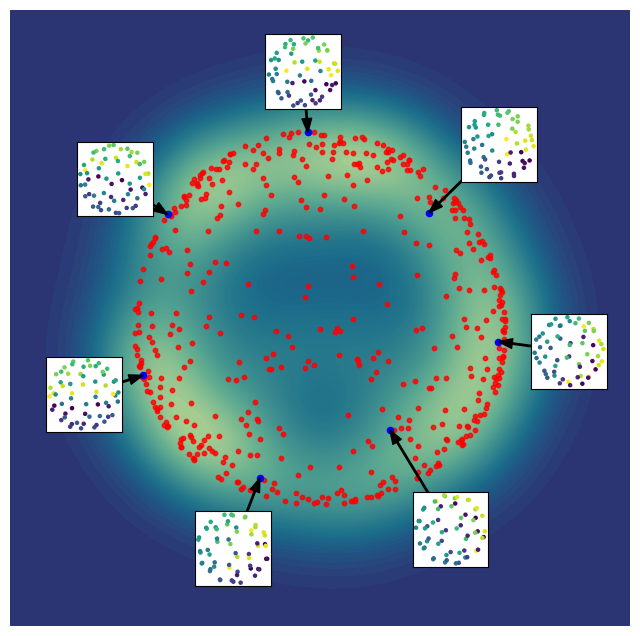

In [37]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
sns.kdeplot(x=bb_mds[:,0], y=bb_mds[:,1], cmap='crest_r', fill=True, levels=100, thresh=-0, ax=ax)
ax.scatter(*zip(*bb_mds), s=10, alpha=0.8, c='red')

ax.scatter(*zip(*(bb_mds[pts_to_annotate])), s=20, c='blue')

mini_axs = dict()
inset_axis_width = 0.2
inset_axis_height = 0.2
for i in pts_to_annotate:
    x, y = bb_mds[i]
    d = np.sqrt(x ** 2 + y ** 2)
    inset_x = 0.66 * x / d 
    inset_y = 0.66 * y / d 
    mini_axs[i] = ax.inset_axes([inset_x - inset_axis_width / 2, inset_y - inset_axis_height / 2, inset_axis_width, inset_axis_height], transform=ax.transData)
    mini_axs[i].scatter(*zip(*bb_aligned_embs[i]), s=5, c=bb_t)
    mini_axs[i].set_xticks([])
    mini_axs[i].set_yticks([])

    ax.annotate('', xy=(x,y), xytext=(inset_x, inset_y), arrowprops=dict(facecolor='black', width=1, headwidth=7, headlength=10))

ax.axis('off')
# plt.savefig('figures/Figure2C.png', bbox_inches='tight')
plt.show()

In [38]:
ripser_res = dict()
ripser_res[2] = ripser(bb_procrustes_dist, distance_matrix=True, maxdim=2, do_cocycles=True, coeff=2)
ripser_res[3] = ripser(bb_procrustes_dist, distance_matrix=True, maxdim=2, coeff=3)
ripser_res[5] = ripser(bb_procrustes_dist, distance_matrix=True, maxdim=2, coeff=5)

In [39]:
dgms = ripser_res[2]['dgms']

In [40]:
idx1 = np.argmax(dgms[1][:, 1] - dgms[1][:, 0])
idx2 = np.argmax(dgms[2][:, 1] - dgms[2][:, 0])

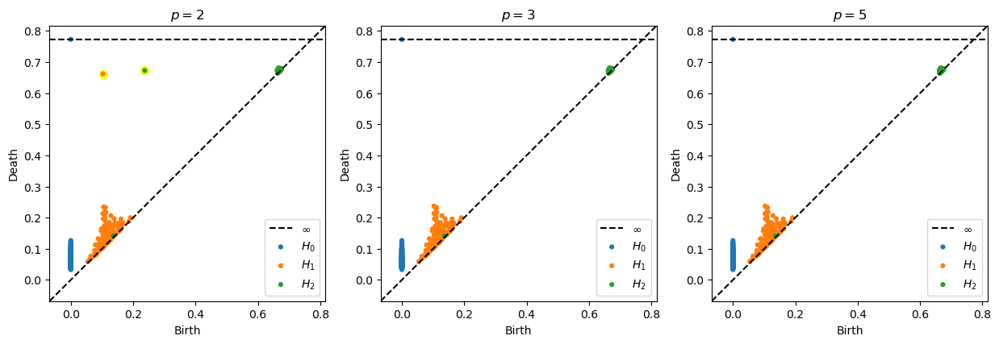

In [41]:
fig, axs = plt.subplots(1, 3, figsize=(15,5), sharex=True, sharey=True)
for p, ax in zip([2, 3, 5], fig.axes):
    ax.set_title('$p = {}$'.format(p))
    ax.yaxis.set_tick_params(labelleft=True)
    plot_diagrams(ripser_res[p]['dgms'], ax=ax, show=False)
    
axs[0].scatter(dgms[1][idx1, 0], dgms[1][idx1, 1], 50, color='yellow', marker='o', zorder=-1)
axs[0].scatter(dgms[2][idx2, 0], dgms[2][idx2, 1], 50, color='yellow', marker='o', zorder=-1)

# plt.savefig('figures/Figure2D.png', bbox_inches='tight')
plt.show()

## Figure 3

In [42]:
sr_params_res = dict()
for r in np.linspace(1.4, 8.4, 30):
    isomap = Isomap(n_neighbors=None, radius=r, n_components=2)
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        sr_params_res[r] = isomap.fit_transform(sr1_X)

In [43]:
sr_params_procrustes_dist = [procrustes(x1, x2)[2] / num_points for x1, x2 in combinations(sr_params_res.values(), 2)]
sr_params_procrustes_dist = squareform(sr_params_procrustes_dist)

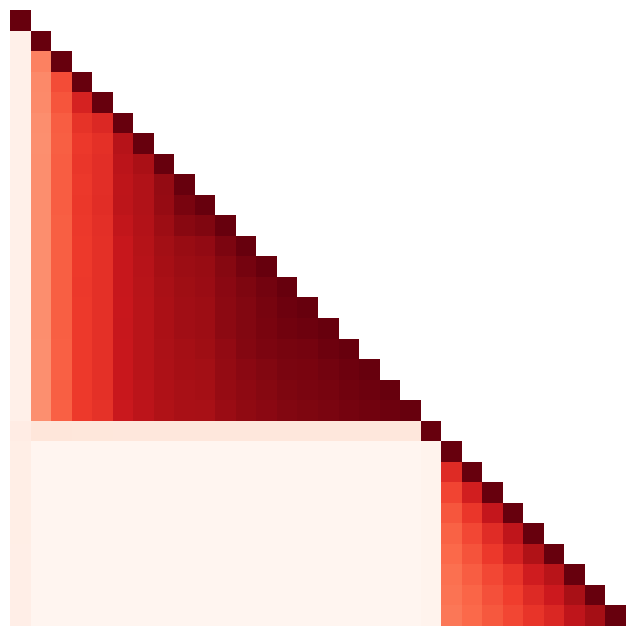

In [44]:
plt.figure(figsize=(8,8))
sns.heatmap(np.log(1e-8 + sr_params_procrustes_dist), cmap='Reds_r', cbar=False, square=True, mask=np.triu(np.ones_like(sr_params_procrustes_dist), 1))
plt.xticks([])
plt.yticks([])
# plt.savefig('figures/Figure3A.png', bbox_inches='tight')
plt.show()

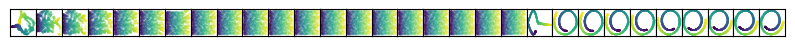

In [45]:
fig, axs = plt.subplots(1, 30, figsize=(10, 0.35))
for r, ax in zip(sr_params_res.keys(), fig.axes):
    ax.scatter(*zip(*sr_params_res[r]), s=0.005, c=sr1_t)
    ax.set_xticks([])
    ax.set_yticks([])
fig.subplots_adjust(wspace=0)
# plt.savefig('figures/Figure3B.png', bbox_inches='tight')
plt.show()

## Figure 4

In [46]:
sr2_X = np.vstack([sr1_X, [[6,10,9]]])

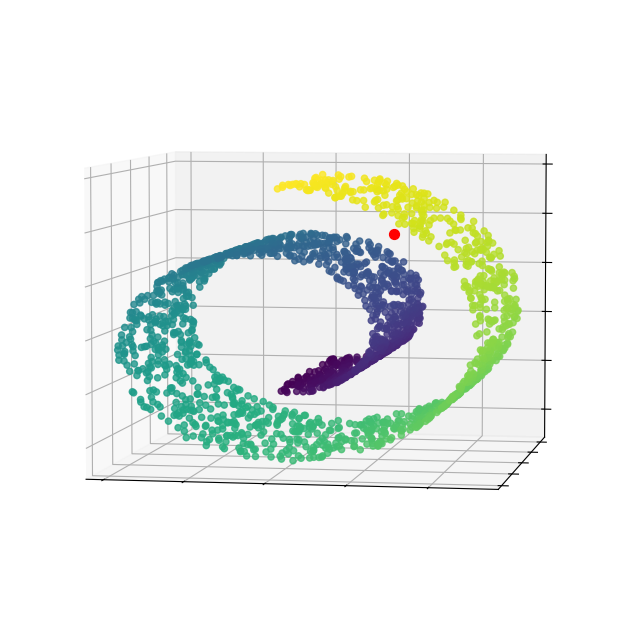

In [47]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(1,1,1, projection='3d')
ax.view_init(5,-80)
ax.dist = 8

ax.scatter(*zip(*sr1_X), c=sr1_t, s=20, alpha=0.8)
ax.scatter([6], [10], [9], c='red', s=50, zorder=3)

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])

# plt.savefig('figures/Figure4A.png', bbox_inches='tight')
plt.show()

In [48]:
isomap = Isomap(n_components=2, n_neighbors=15)
sr2_res = isomap.fit_transform(sr2_X)

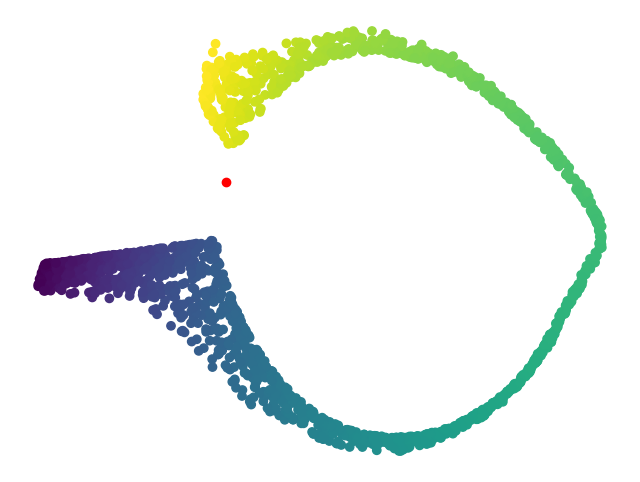

In [49]:
plt.figure(figsize=(8,6))
plt.scatter(*zip(*sr2_res[:-1]), c=sr1_t)
plt.scatter(*sr2_res[-1], c='red')
plt.axis('off')
# plt.savefig('figures/Figure4B.png', bbox_inches='tight')
plt.show()

In [50]:
num_trials = 100
isomap = Isomap(n_components=2, n_neighbors=5)

sr2_indices = list()
sr2_results = list()
rng = np.random.default_rng(seed=42)
for _ in range(num_trials):
    ix = rng.choice(np.arange(len(sr2_X)), size=600, replace=False)
    X_sample = sr2_X[ix,:]
    sr2_indices.append(ix)
    res = np.empty(shape=(sr2_X.shape[0], 2))
    res[:] = np.nan
    res[ix,:] = isomap.fit_transform(X_sample)
    sr2_results.append(res)

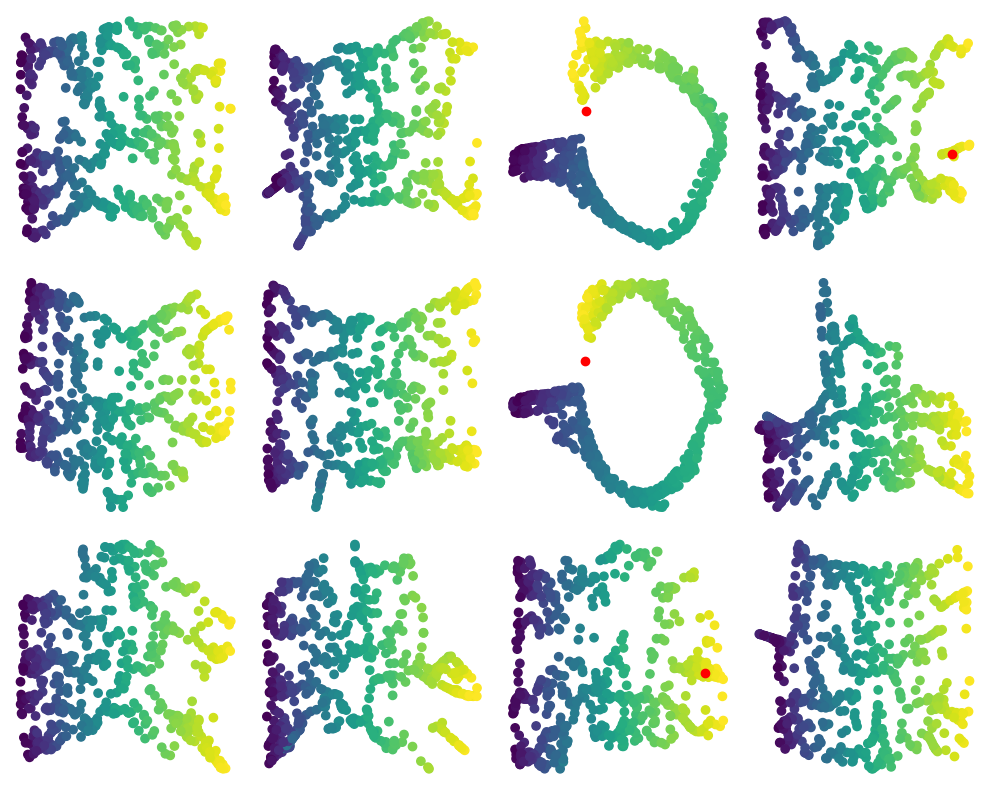

In [51]:
fig, axs = plt.subplots(3, 4, figsize=(10,8))
for i, ax in enumerate(fig.axes):
    ax.scatter(*zip(*sr2_results[i][:-1]), c=sr1_t)
    ax.scatter(*sr2_results[i][-1], c='red')
    ax.axis('off')
plt.tight_layout()
# plt.savefig('figures/Figure4C.png', bbox_inches='tight')
plt.show()

In [52]:
sr2_procrustes_dist = list()
for x1, x2 in combinations(sr2_results, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    sr2_procrustes_dist.append(d)
sr2_procrustes_dist = squareform(sr2_procrustes_dist)

In [53]:
d_link = linkage(squareform(sr2_procrustes_dist), method='complete', optimal_ordering=True)
leaves_order = leaves_list(d_link)

In [54]:
sr2_clusters = fcluster(d_link, t=2, criterion='maxclust')

In [55]:
row_colors = [colorkey.get(c, 'grey') for c in sr2_clusters]

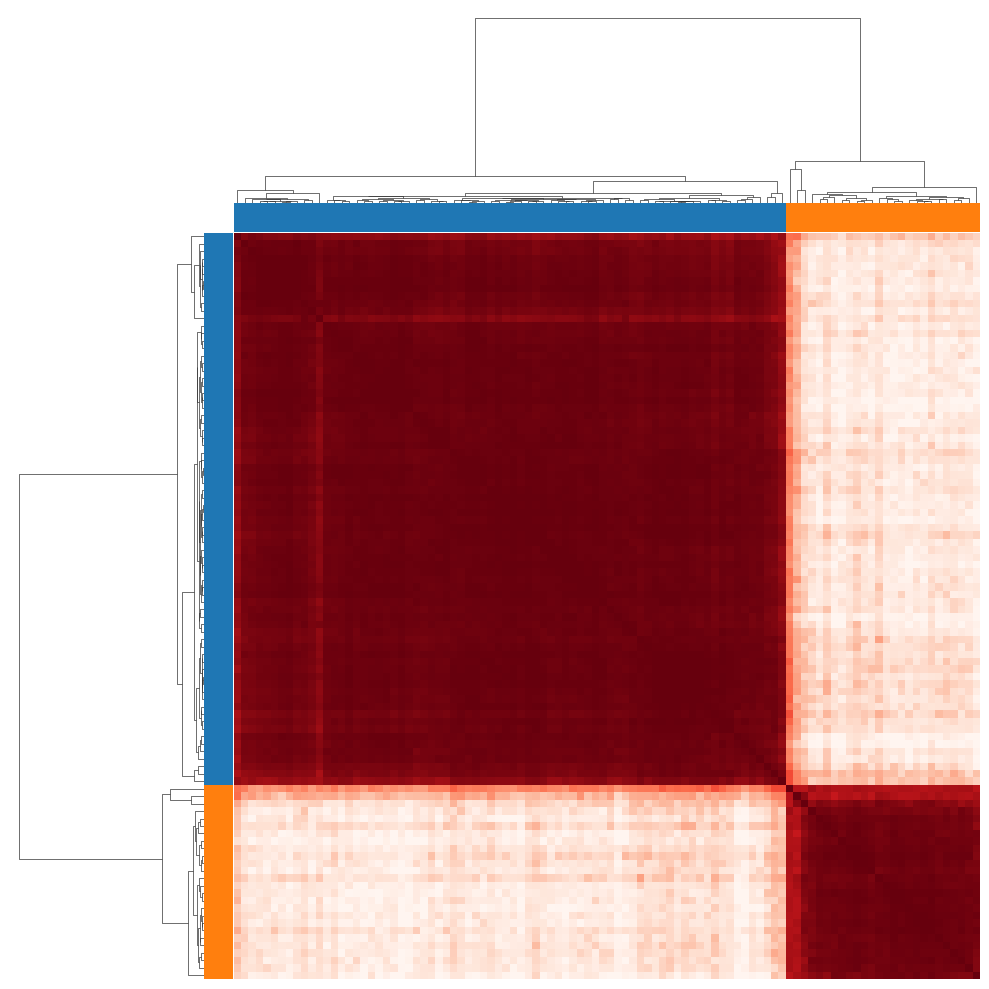

In [56]:
sns.clustermap(pd.DataFrame(sr2_procrustes_dist), row_linkage=d_link, col_linkage=d_link, row_colors=row_colors, col_colors=row_colors, cmap='Reds_r', robust=True, cbar_pos=None, xticklabels=False, yticklabels=False)
plt.show()

In [57]:
sr2_gpa = GPA(centering=True, verbose=True)
sr2_Z = sr2_gpa.fit_transform(np.array(sr2_results)[sr2_clusters == 1])

iteration 1: loss = 2.751335
iteration 2: loss = 1.241165
iteration 3: loss = 1.176492
iteration 4: loss = 1.176471
iteration 5: loss = 1.176471
iteration 6: loss = 1.176471


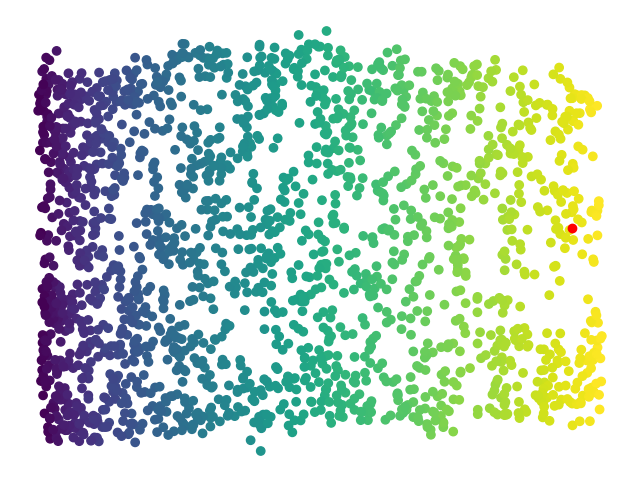

In [58]:
plt.figure(figsize=(8,6))
plt.scatter(*zip(*sr2_gpa.Z[:-1]), c=sr1_t)
plt.scatter(*sr2_gpa.Z[-1], c='red')
plt.axis('off')
# plt.savefig('figures/Figure4D.png', bbox_inches='tight')
plt.show()

### Impact

In [59]:
sr2_indices_df = pd.DataFrame(MultiLabelBinarizer(classes=np.arange(len(sr2_X))).fit_transform(sr2_indices))
sr2_indices_df = sr2_indices_df.divide(sr2_indices_df.sum())

In [60]:
sr2_d = list()
for x1 in sr2_results:
    ix1 = ~np.any(np.isnan(x1), axis=1)
    d = procrustes(x1[ix1, :], sr2_gpa.Z[ix1, :])[2] / len(ix1)
    sr2_d.append(d ** 2)

In [61]:
sr2_c = sr2_indices_df.T.dot(sr2_d)

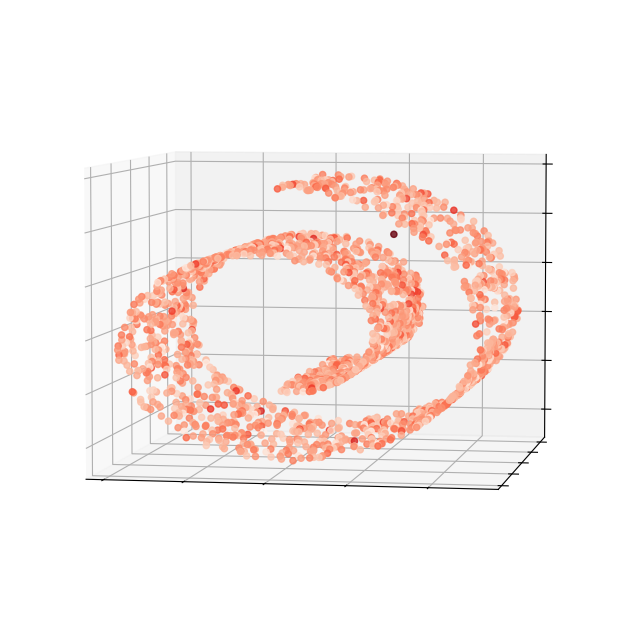

In [62]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(1,1,1, projection='3d')
ax.view_init(5,-80)
ax.dist = 8

ax.scatter(*zip(*sr2_X), c=sr2_c, cmap='Reds', s=20, alpha=0.8)

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])

# plt.savefig('figures/Figure4E.png', bbox_inches='tight')
plt.show()

## Figure 5

In [63]:
num_outliers = 100

rng = np.random.default_rng(seed=42)
z1 = rng.uniform(low=-15, high=15, size=(num_outliers,1))
z2 = rng.uniform(low=0, high=25, size=(num_outliers,1))
z3 = rng.uniform(low=-15, high=15, size=(num_outliers,1))
sr3_Z = np.hstack([z1, z2, z3])

sr3_X = np.vstack([sr1_X, sr3_Z])

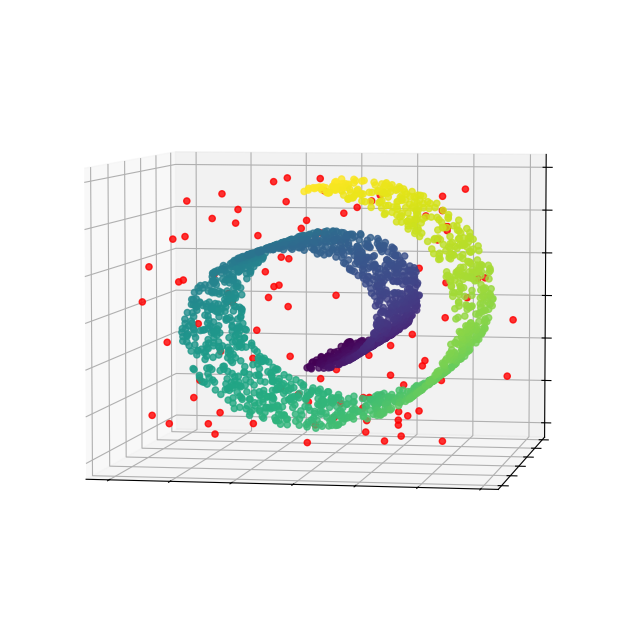

In [64]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(1,1,1, projection='3d')
ax.view_init(5,-80)
ax.dist = 8

ax.scatter(*zip(*sr1_X), c=sr1_t, s=20, alpha=0.8)
ax.scatter(*zip(*sr3_Z), c='red', s=20, alpha=0.8)

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])

# plt.tight_layout()
# plt.savefig('figures/Figure5A.png', bbox_inches='tight')
plt.show()

In [65]:
isomap = Isomap(n_components=2, n_neighbors=15)
sr3_res = isomap.fit_transform(sr3_X)

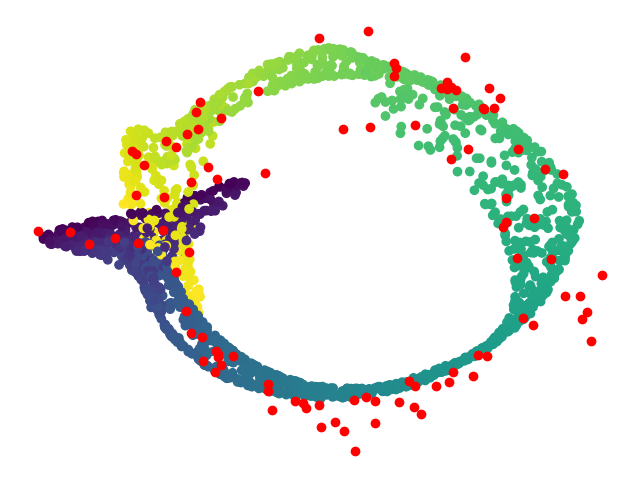

In [66]:
plt.figure(figsize=(8,6))
plt.scatter(*zip(*sr3_res[:-num_outliers]), c=sr1_t)
plt.scatter(*zip(*sr3_res[-num_outliers:]), c='red')
plt.axis('off')
# plt.savefig('figures/Figure5B.png', bbox_inches='tight')
plt.show()

In [67]:
num_trials = 200
isomap = Isomap(n_components=2, n_neighbors=5)

sr3_indices = list()
sr3_results = list()
rng = np.random.default_rng(seed=42)
for _ in tqdm(range(num_trials)):
    ix = rng.choice(np.arange(len(sr3_X)), size=600, replace=False)
    X_sample = sr3_X[ix,:]
    sr3_indices.append(ix)
    res = np.empty(shape=(sr3_X.shape[0], 2))
    res[:] = np.nan
    res[ix,:] = isomap.fit_transform(X_sample)
    sr3_results.append(res)

  0%|          | 0/200 [00:00<?, ?it/s]

 24%|██▎       | 47/200 [00:04<00:13, 11.05it/s]/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
 40%|███▉      | 79/200 [00:07<00:10, 11.14it/s]/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/opt/anaconda3/envs/scanpy-rips

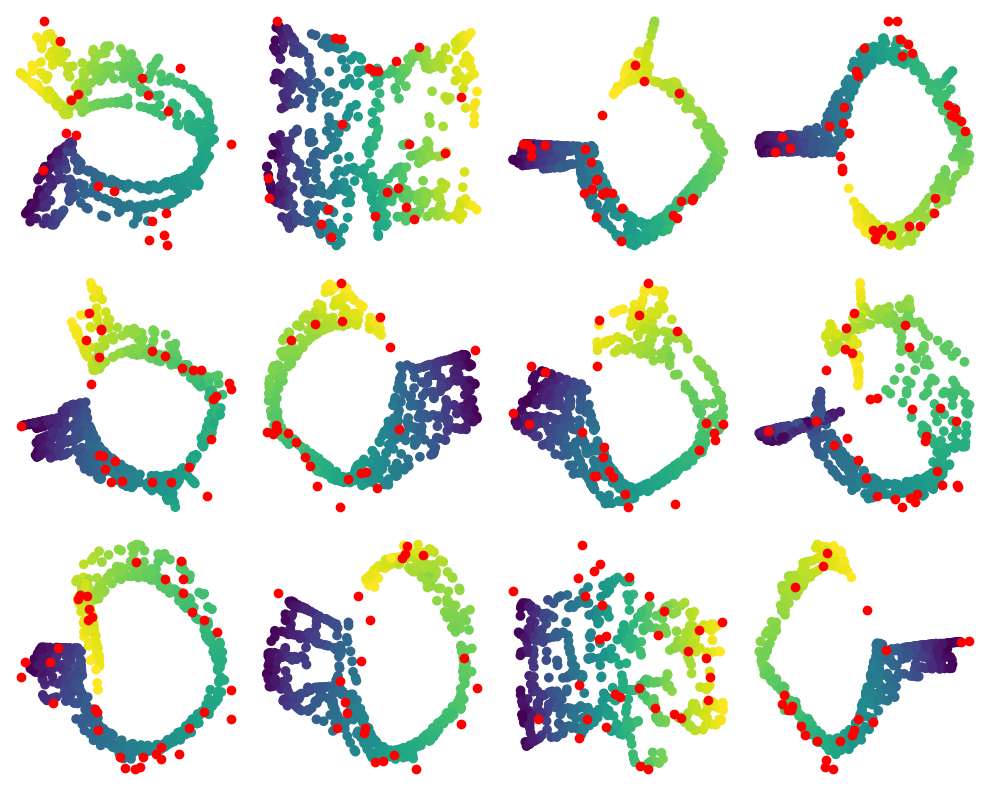

In [68]:
fig, axs = plt.subplots(3, 4, figsize=(10,8))
for i, ax in enumerate(fig.axes):
    ax.scatter(*zip(*sr3_results[i][:-num_outliers]), c=sr1_t)
    ax.scatter(*zip(*sr3_results[i][-num_outliers:]), c='red')
    ax.axis('off')
plt.tight_layout()
# plt.savefig('figures/Figure5C.png', bbox_inches='tight')
plt.show()

In [69]:
sr3_procrustes_dist = list()
for x1, x2 in combinations(sr3_results, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    sr3_procrustes_dist.append(d)
sr3_procrustes_dist = squareform(sr3_procrustes_dist)

In [70]:
d_link = linkage(squareform(sr3_procrustes_dist), method='complete', optimal_ordering=True)
leaves_order = leaves_list(d_link)

In [71]:
sr3_clusters = fcluster(d_link, t=6, criterion='maxclust')

In [72]:
row_colors = [colorkey.get(c, 'grey') for c in sr3_clusters]

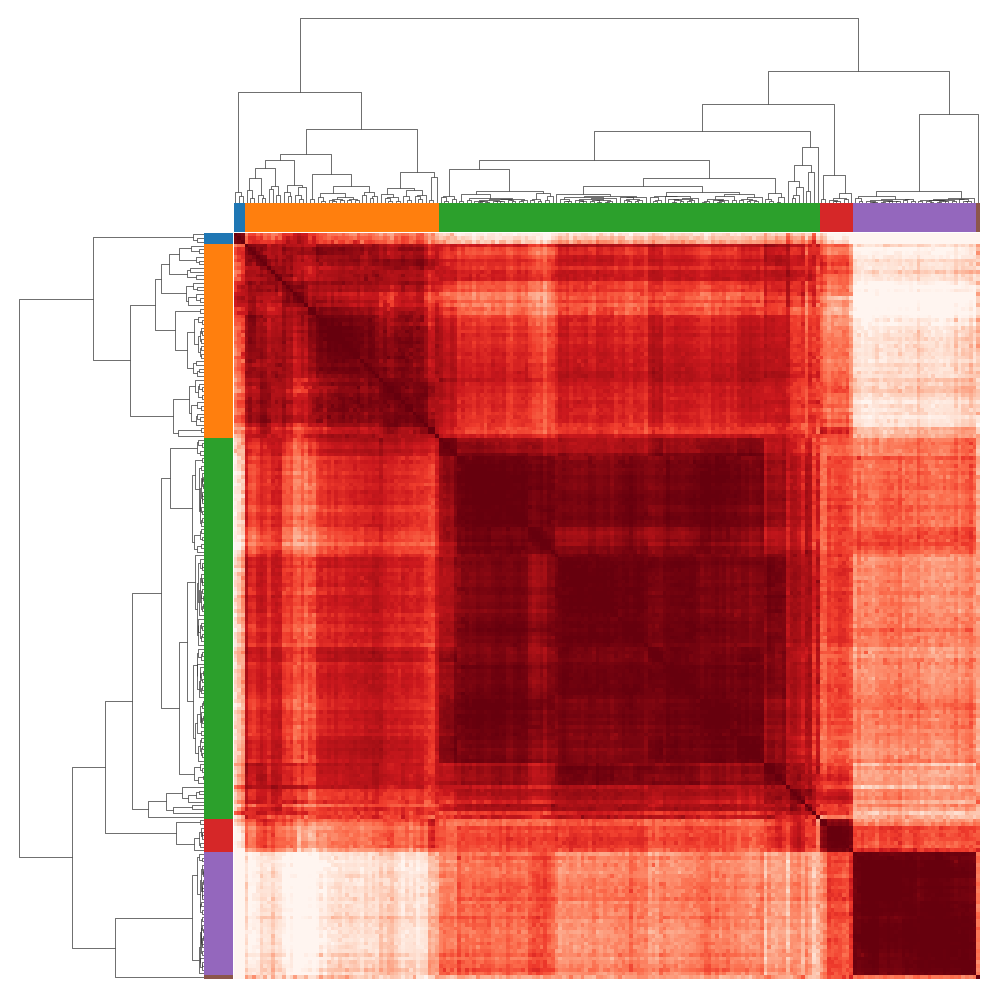

In [73]:
sns.clustermap(pd.DataFrame(sr3_procrustes_dist), row_linkage=d_link, col_linkage=d_link, row_colors=row_colors, col_colors=row_colors, cmap='Reds_r', robust=True, cbar_pos=None, xticklabels=False, yticklabels=False)
plt.show()

In [74]:
sr3_gpa = GPA(centering=True, verbose=True)
sr3_gpa_Z = sr3_gpa.fit_transform(np.array(sr3_results)[sr3_clusters == 5])

iteration 1: loss = 1.049224
iteration 2: loss = 1.046110
iteration 3: loss = 1.046090
iteration 4: loss = 1.046090
iteration 5: loss = 1.046090
iteration 6: loss = 1.046090


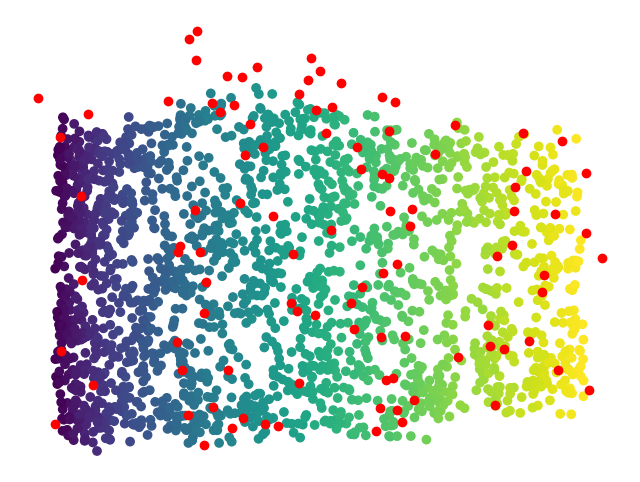

In [75]:
plt.figure(figsize=(8,6))
plt.scatter(*zip(*sr3_gpa.Z[:num_points]), c=sr1_t)
plt.scatter(*zip(*sr3_gpa.Z[num_points:]), c='red')
plt.axis('off')
# plt.savefig('figures/Figure5D.png', bbox_inches='tight')
plt.show()

### Impact

In [76]:
sr3_indices_df = pd.DataFrame(MultiLabelBinarizer(classes=np.arange(len(sr3_X))).fit_transform(sr3_indices))
sr3_indices_df = sr3_indices_df.divide(sr3_indices_df.sum())

In [77]:
sr3_d = list()
for x1 in sr3_results:
    ix1 = ~np.any(np.isnan(x1), axis=1)
    d = procrustes(x1[ix1, :], sr3_gpa.Z[ix1, :])[2] / len(ix1)
    sr3_d.append(d)

In [78]:
sr3_c = sr3_indices_df.T.dot(sr3_d)

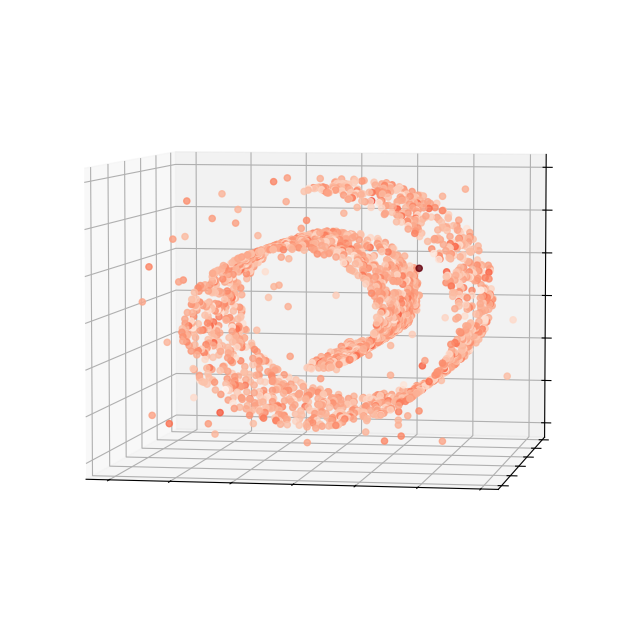

In [79]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(1,1,1, projection='3d')
ax.view_init(5,-80)
ax.dist = 8

ax.scatter(*zip(*sr3_X), c=sr3_c, cmap='Reds', s=20, alpha=0.8)

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])

# plt.savefig('figures/Figure5E.png', bbox_inches='tight')
plt.show()

## Figure 6

In [15]:
def tiny_axes(ax, xlabel='', ylabel=''):
    tiny_ax = ax.inset_axes((0,0,0.2,0.2))
    tiny_ax.spines['left'].set_position('zero')
    tiny_ax.spines['bottom'].set_position('zero')
    tiny_ax.spines[['right', 'top']].set_visible(False)
    tiny_ax.set_xticks([])
    tiny_ax.set_yticks([])
    tiny_ax.set_xlabel(xlabel)
    tiny_ax.set_ylabel(ylabel)
    tiny_ax.plot(1, 0, ">k", markersize=10, clip_on=False)
    tiny_ax.plot(0, 1, "^k", markersize=10, clip_on=False)
    tiny_ax.spines['left'].set(linewidth=3)
    tiny_ax.spines['bottom'].set(linewidth=3)
    tiny_ax.patch.set_alpha(0)

    return tiny_ax

In [16]:
digits_X, digits_y = load_digits(return_X_y=True)

In [17]:
pca = PCA(n_components=2)
digits_pca = pca.fit_transform(digits_X)

In [18]:
isomap = Isomap(n_components=2, n_neighbors=10)
digits_isomap = isomap.fit_transform(digits_X)

In [19]:
lem = SpectralEmbedding(n_components=2, random_state=42)
digits_lem = lem.fit_transform(digits_X)

In [20]:
tsne = TSNE(n_components=2)
digits_tsne = tsne.fit_transform(digits_X)

In [21]:
umap = UMAP(n_components=2)
digits_umap = umap.fit_transform(digits_X)

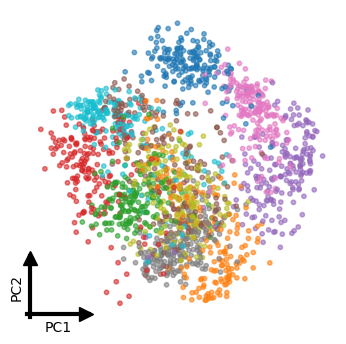

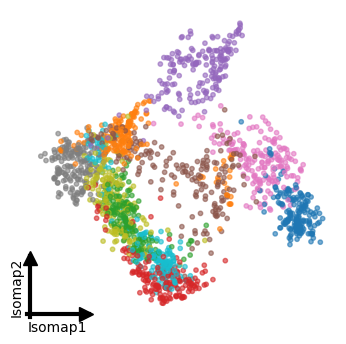

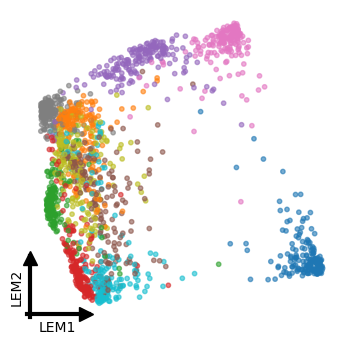

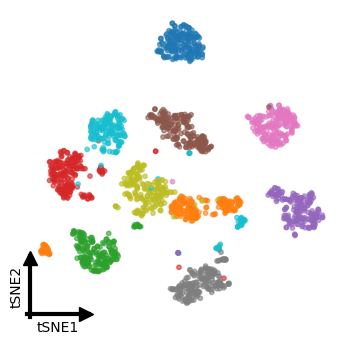

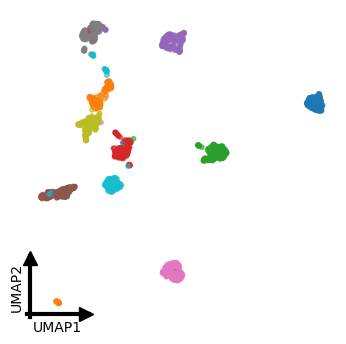

In [22]:
plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*digits_pca), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'PC1', 'PC2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*digits_isomap), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'Isomap1', 'Isomap2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*digits_lem), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'LEM1', 'LEM2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*digits_tsne), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'tSNE1', 'tSNE2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*digits_umap), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'UMAP1', 'UMAP2')
plt.show()

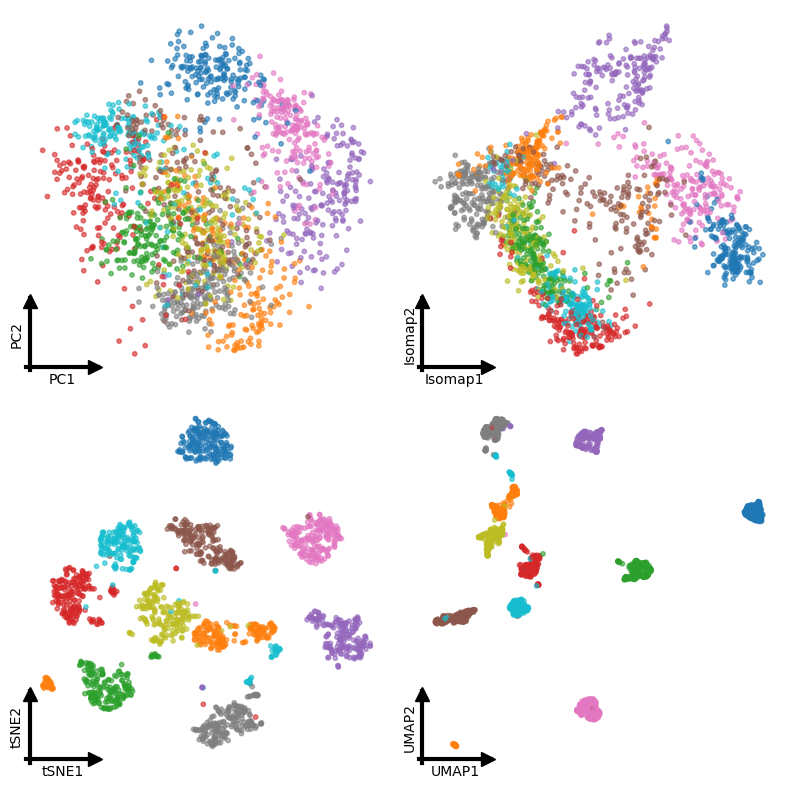

In [23]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

axs[0][0].scatter(*zip(*digits_pca), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[0][0].axis('off')
axs00_small = tiny_axes(axs[0][0], 'PC1', 'PC2')


axs[0][1].scatter(*zip(*digits_isomap), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[0][1].axis('off')
axs01_small = tiny_axes(axs[0][1], 'Isomap1', 'Isomap2')

axs[1][0].scatter(*zip(*digits_tsne), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[1][0].axis('off')
axs10_small = tiny_axes(axs[1][0], 'tSNE1', 'tSNE2')

axs[1][1].scatter(*zip(*digits_umap), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[1][1].axis('off')
axs11_small = tiny_axes(axs[1][1], 'UMAP1', 'UMAP2')

# fig.legend(
#     handles=[Line2D([], [], marker='.', markersize=20, color=c, label=i, ls='None') for i, c in enumerate(plt.cm.tab10.colors)],
#     loc='center left',
#     bbox_to_anchor=(1,0.5),
#     fontsize='large',
#     frameon=False
# )

plt.tight_layout()
# plt.savefig('figures/Figure6A.png', bbox_inches='tight')
plt.show()

In [24]:
rng = np.random.default_rng(seed=42)
num_subsamples = 200
sample_size = 500

digits_subsamples = []
for _ in range(num_subsamples):
    ix = rng.choice(np.arange(len(digits_X)), sample_size)
    subsample = digits_X[ix].copy()
    digits_subsamples.append((ix, subsample))

In [25]:
digits_pca_samples = np.empty(shape=(num_subsamples, len(digits_X), pca.n_components))
digits_pca_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(digits_subsamples)):
    ix, subsample = ix_subsample
    digits_pca_samples[i, ix] = pca.fit_transform(subsample)

200it [00:00, 413.56it/s]


In [26]:
digits_isomap_samples = np.empty(shape=(num_subsamples, len(digits_X), isomap.n_components))
digits_isomap_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(digits_subsamples)):
    ix, subsample = ix_subsample
    digits_isomap_samples[i, ix] = isomap.fit_transform(subsample)

200it [00:19, 10.16it/s]


In [27]:
digits_lem_samples = np.empty(shape=(num_subsamples, len(digits_X), isomap.n_components))
digits_lem_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(digits_subsamples)):
    ix, subsample = ix_subsample
    digits_lem_samples[i, ix] = lem.fit_transform(subsample)

200it [00:08, 23.68it/s]


In [28]:
digits_tsne_samples = np.empty(shape=(num_subsamples, len(digits_X), tsne.n_components))
digits_tsne_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(digits_subsamples)):
    ix, subsample = ix_subsample
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        digits_tsne_samples[i, ix] = tsne.fit_transform(subsample)

200it [02:51,  1.16it/s]


In [29]:
digits_umap_samples = np.empty(shape=(num_subsamples, len(digits_X), umap.n_components))
digits_umap_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(digits_subsamples)):
    ix, subsample = ix_subsample
    digits_umap_samples[i, ix] = umap.fit_transform(subsample)

200it [05:51,  1.76s/it]


In [30]:
digits_gpa = GPA(centering=True, verbose=True)

In [31]:
%%time
digits_gpa.fit(digits_pca_samples)
digits_rpca = digits_gpa.Z

iteration 1: loss = 1.625005
iteration 2: loss = 1.550109
iteration 3: loss = 1.550062
iteration 4: loss = 1.550062
iteration 5: loss = 1.550062
CPU times: user 34.4 s, sys: 21.7 s, total: 56 s
Wall time: 24.4 s


In [32]:
%%time
digits_gpa.fit(digits_isomap_samples)
digits_risomap = digits_gpa.Z

iteration 1: loss = 12.791508
iteration 2: loss = 12.363685
iteration 3: loss = 12.348712
iteration 4: loss = 12.348446
iteration 5: loss = 12.348442
iteration 6: loss = 12.348441
iteration 7: loss = 12.348441
iteration 8: loss = 12.348441
CPU times: user 46.5 s, sys: 18.7 s, total: 1min 5s
Wall time: 20.2 s


In [33]:
%%time
digits_gpa.fit(digits_lem_samples)
digits_rlem = digits_gpa.Z

iteration 1: loss = 0.000921
iteration 2: loss = 0.000907
iteration 3: loss = 0.000907
iteration 4: loss = 0.000907
CPU times: user 28.4 s, sys: 18 s, total: 46.4 s
Wall time: 17.9 s


In [34]:
%%time
digits_gpa.fit(digits_tsne_samples)
digits_rtsne = digits_gpa.Z

iteration 1: loss = 3.282567
iteration 2: loss = 3.175864
iteration 3: loss = 3.175012
iteration 4: loss = 3.175011
iteration 5: loss = 3.175011
iteration 6: loss = 3.175011
CPU times: user 37 s, sys: 19 s, total: 56 s
Wall time: 19 s


In [35]:
%%time
digits_gpa.fit(digits_umap_samples)
digits_rumap = digits_gpa.Z

iteration 1: loss = 3.238599
iteration 2: loss = 1.898817
iteration 3: loss = 1.791937
iteration 4: loss = 1.749705
iteration 5: loss = 1.697419
iteration 6: loss = 1.725614
iteration 7: loss = 1.624201
iteration 8: loss = 1.624030
iteration 9: loss = 1.655645
iteration 10: loss = 1.623661
iteration 11: loss = 1.623635
iteration 12: loss = 1.623633
iteration 13: loss = 1.623633
iteration 14: loss = 1.623633
iteration 15: loss = 1.623633
CPU times: user 1min 13s, sys: 19.2 s, total: 1min 32s
Wall time: 22 s


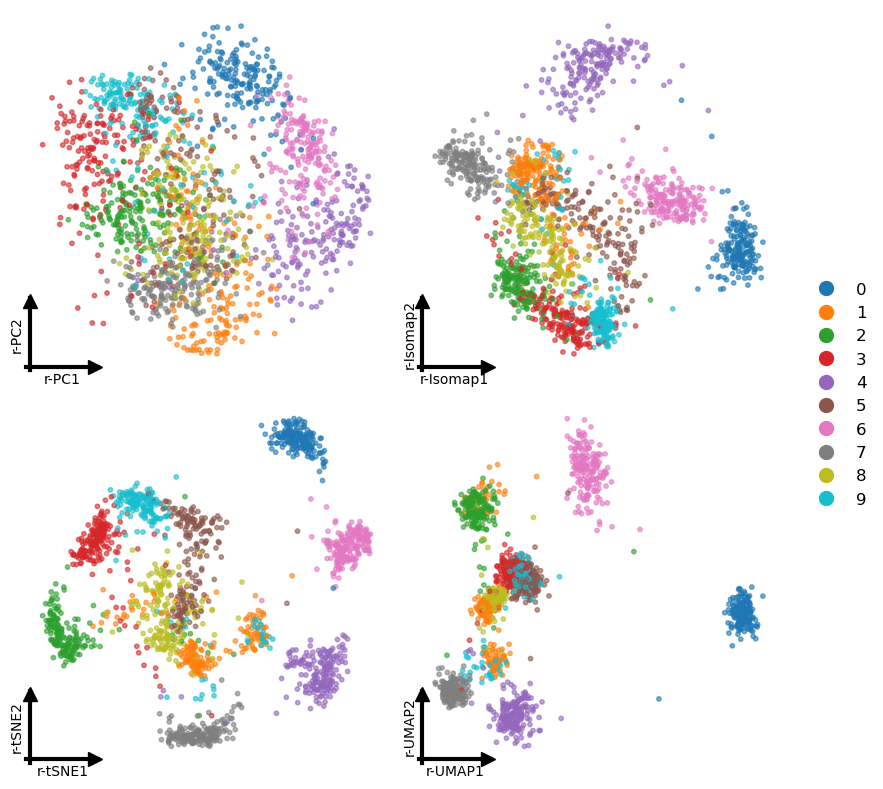

In [36]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

axs[0][0].scatter(*zip(*digits_rpca), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[0][0].axis('off')
axs00_small = tiny_axes(axs[0][0], 'r-PC1', 'r-PC2')


axs[0][1].scatter(*zip(*digits_risomap), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[0][1].axis('off')
axs01_small = tiny_axes(axs[0][1], 'r-Isomap1', 'r-Isomap2')

axs[1][0].scatter(*zip(*digits_rtsne), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[1][0].axis('off')
axs10_small = tiny_axes(axs[1][0], 'r-tSNE1', 'r-tSNE2')

axs[1][1].scatter(*zip(*digits_rumap), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[1][1].axis('off')
axs11_small = tiny_axes(axs[1][1], 'r-UMAP1', 'r-UMAP2')

fig.legend(
    handles=[Line2D([], [], marker='.', markersize=20, color=c, label=i, ls='None') for i, c in enumerate(plt.cm.tab10.colors)],
    loc='center left',
    bbox_to_anchor=(1,0.5),
    fontsize='large',
    frameon=False
)

plt.tight_layout()
# plt.savefig('figures/Figure6B.png', bbox_inches='tight')
plt.show()

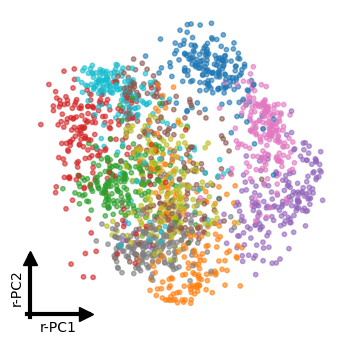

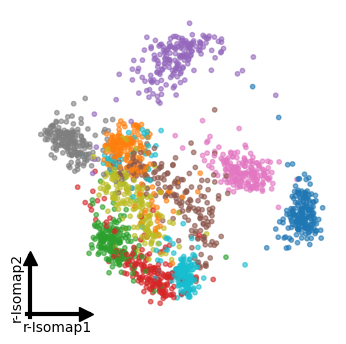

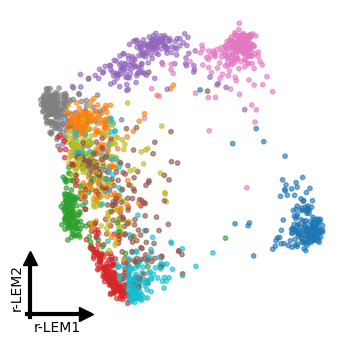

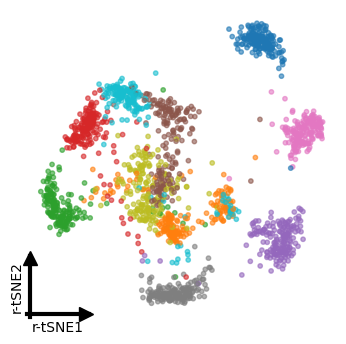

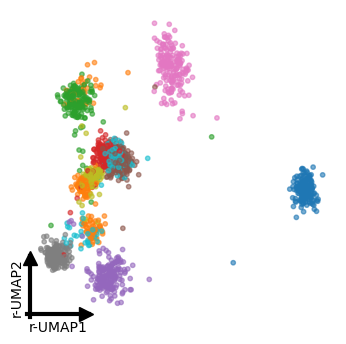

In [37]:
plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*digits_rpca), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-PC1', 'r-PC2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*digits_risomap), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-Isomap1', 'r-Isomap2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*digits_rlem), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-LEM1', 'r-LEM2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*digits_rtsne), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-tSNE1', 'r-tSNE2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*digits_rumap), c=digits_y, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-UMAP1', 'r-UMAP2')
plt.show()

### Procrustes-MDS

In [38]:
%%time
digits_pca_procrustes_dist = list()
for x1, x2 in combinations(digits_pca_samples[:,:,:2], 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    digits_pca_procrustes_dist.append(d)
digits_pca_procrustes_dist = squareform(digits_pca_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
digits_pca_procrustes_mds = mds.fit_transform(digits_pca_procrustes_dist)

CPU times: user 4.93 s, sys: 119 ms, total: 5.05 s
Wall time: 3.7 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


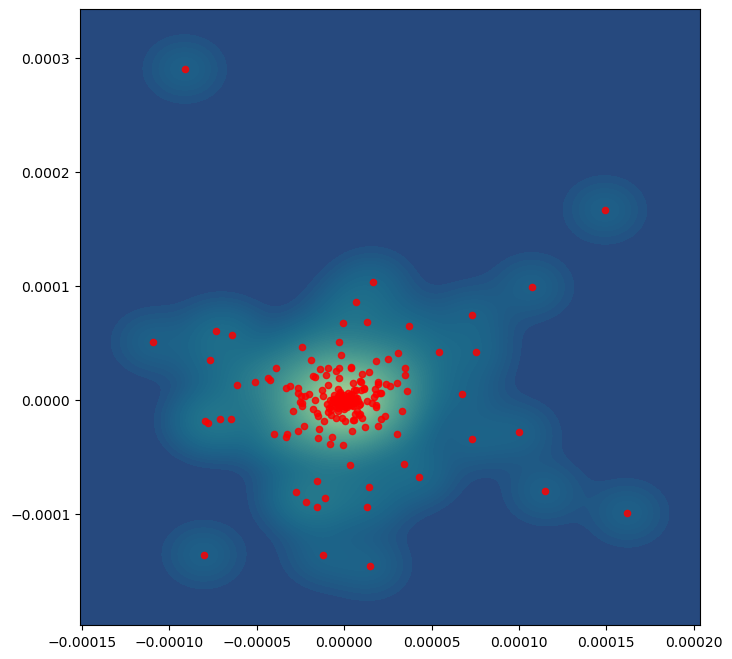

In [39]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=digits_pca_procrustes_mds[:,0], y=digits_pca_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*digits_pca_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [40]:
%%time
digits_isomap_procrustes_dist = list()
for x1, x2 in combinations(digits_isomap_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    digits_isomap_procrustes_dist.append(d)
digits_isomap_procrustes_dist = squareform(digits_isomap_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
digits_isomap_procrustes_mds = mds.fit_transform(digits_isomap_procrustes_dist)

CPU times: user 3.96 s, sys: 55.6 ms, total: 4.02 s
Wall time: 3.66 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


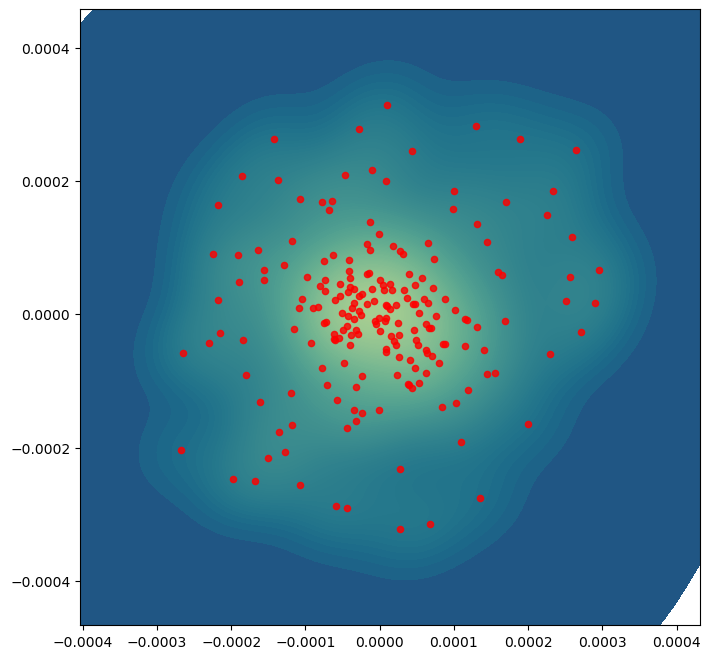

In [41]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=digits_isomap_procrustes_mds[:,0], y=digits_isomap_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*digits_isomap_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [42]:
%%time
digits_lem_procrustes_dist = list()
for x1, x2 in combinations(digits_lem_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    digits_lem_procrustes_dist.append(d)
digits_lem_procrustes_dist = squareform(digits_lem_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
digits_lem_procrustes_mds = mds.fit_transform(digits_lem_procrustes_dist)

CPU times: user 3.89 s, sys: 49.1 ms, total: 3.94 s
Wall time: 3.59 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


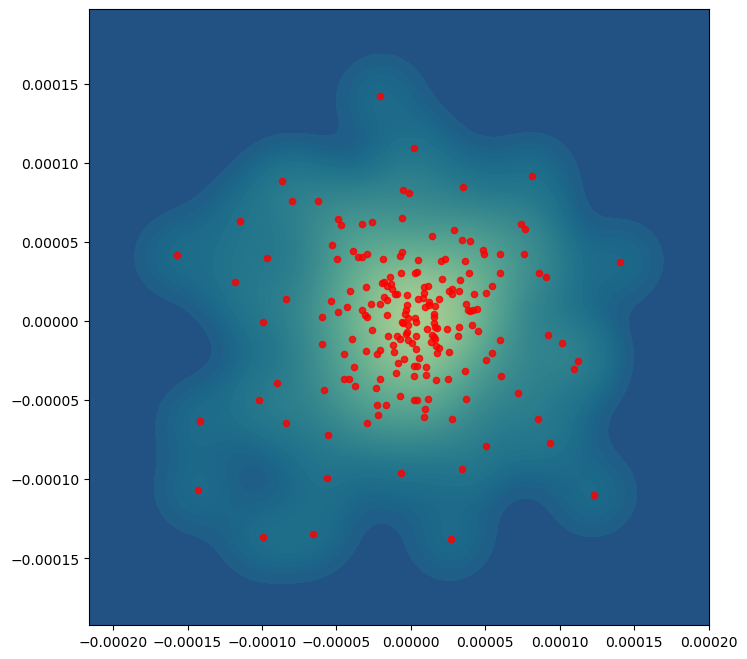

In [43]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=digits_lem_procrustes_mds[:,0], y=digits_lem_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*digits_lem_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [44]:
%%time
digits_tsne_procrustes_dist = list()
for x1, x2 in combinations(digits_tsne_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    digits_tsne_procrustes_dist.append(d)
digits_tsne_procrustes_dist = squareform(digits_tsne_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
digits_tsne_procrustes_mds = mds.fit_transform(digits_tsne_procrustes_dist)

CPU times: user 3.83 s, sys: 43.1 ms, total: 3.88 s
Wall time: 3.64 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


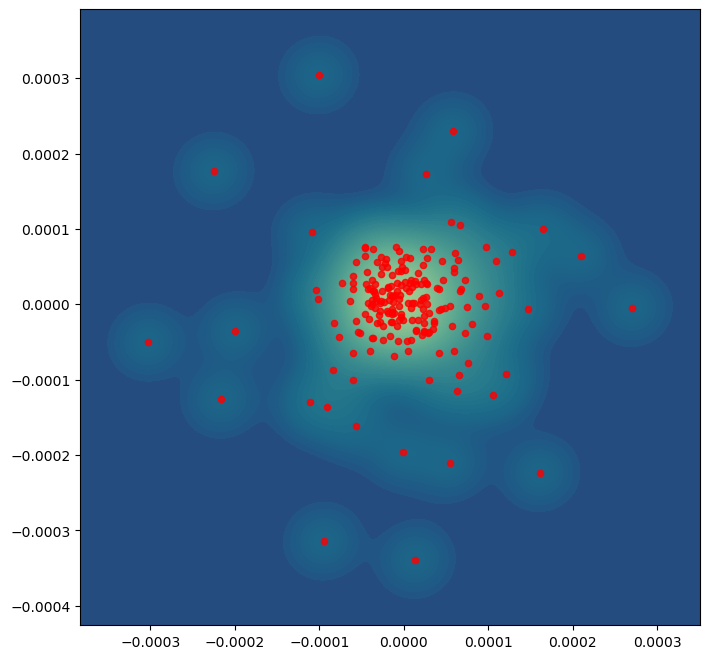

In [45]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=digits_tsne_procrustes_mds[:,0], y=digits_tsne_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*digits_tsne_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [46]:
%%time
digits_umap_procrustes_dist = list()
for x1, x2 in combinations(digits_umap_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    digits_umap_procrustes_dist.append(d)
digits_umap_procrustes_dist = squareform(digits_umap_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
digits_umap_procrustes_mds = mds.fit_transform(digits_umap_procrustes_dist)

CPU times: user 3.95 s, sys: 51.8 ms, total: 4 s
Wall time: 3.61 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


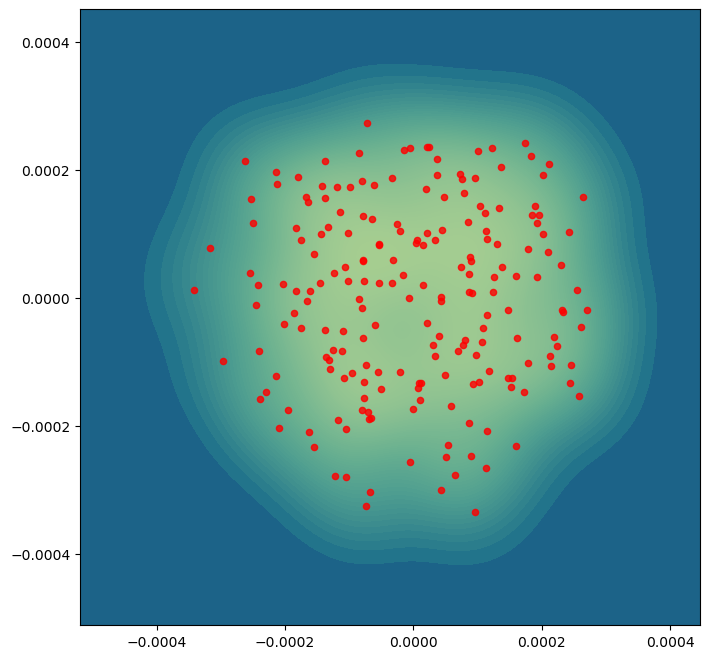

In [47]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=digits_umap_procrustes_mds[:,0], y=digits_umap_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*digits_umap_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [ ]:
np.savez_compressed(
    '../results/digits_procrustes_dist.npz',
    pca = squareform(digits_pca_procrustes_dist),
    isomap = squareform(digits_isomap_procrustes_dist),
    lem = squareform(digits_lem_procrustes_dist),
    tsne = squareform(digits_tsne_procrustes_dist),
    umap = squareform(digits_umap_procrustes_dist)
)

## Figure 7

In [48]:
pbmc_adata = sc.read_h5ad('../data/pbmc3k_processed.h5ad')

/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/anndata/compat/__init__.py:298: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/anndata/compat/__init__.py:298: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(


In [49]:
pbmc_adata

AnnData object with n_obs × n_vars = 2638 × 1838
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'n_cells'
    uns: 'draw_graph', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_draw_graph_fr'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [50]:
pbmc_X = pbmc_adata.X
pbmc_y = pbmc_adata.obs['louvain']

In [51]:
pbmc_c = [dict(zip(pbmc_y.cat.categories, pbmc_adata.uns['louvain_colors'])).get(y) for y in pbmc_y]

/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


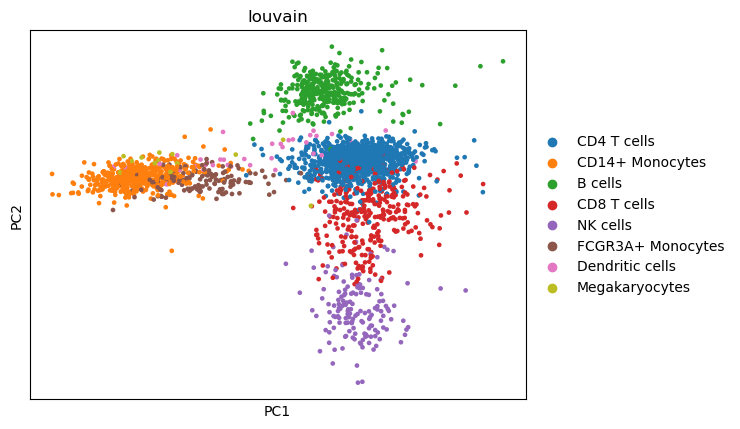

In [52]:
ax=plt.gca()
sc.pl.pca(pbmc_adata, color='louvain', ax=ax)
pbmc_h, pbmc_l = ax.get_legend_handles_labels()

In [53]:
pca = PCA(n_components=50)
pbmc_pca = pca.fit_transform(pbmc_X)

In [54]:
isomap = Isomap(n_components=2, n_neighbors=15)
pbmc_isomap = isomap.fit_transform(pbmc_pca)

In [55]:
lem = SpectralEmbedding(n_components=2, random_state=42)
pbmc_lem = lem.fit_transform(pbmc_pca)

In [56]:
tsne = TSNE(n_components=2, perplexity=30, early_exaggeration=12, learning_rate=200)
pbmc_tsne = tsne.fit_transform(pbmc_pca)

In [57]:
umap = UMAP(n_components=2, min_dist=0.5, spread=1.0)
pbmc_umap = umap.fit_transform(pbmc_pca)

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/376471359.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*pbmc_pca[:,:2]), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')


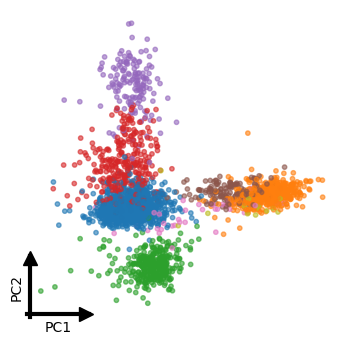

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/376471359.py:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*pbmc_isomap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')


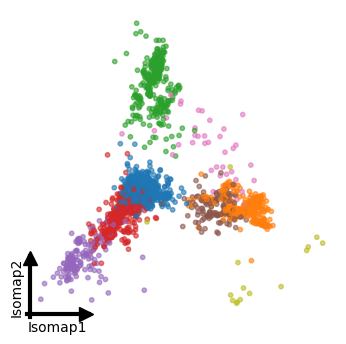

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/376471359.py:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*pbmc_lem), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')


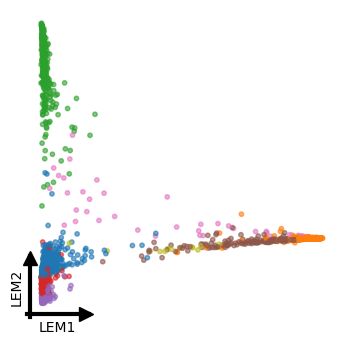

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/376471359.py:24: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*pbmc_tsne), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')


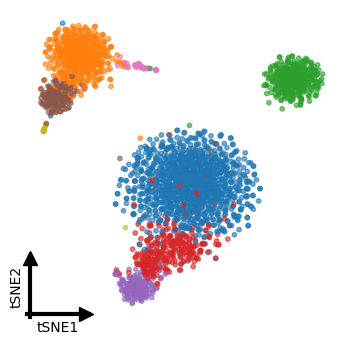

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/376471359.py:31: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*pbmc_umap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')


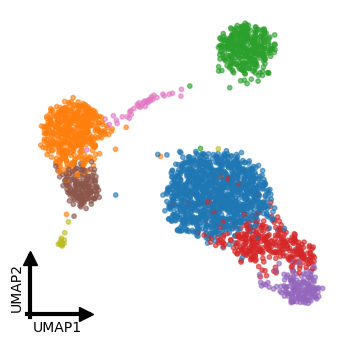

In [58]:
plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*pbmc_pca[:,:2]), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'PC1', 'PC2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*pbmc_isomap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'Isomap1', 'Isomap2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*pbmc_lem), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'LEM1', 'LEM2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*pbmc_tsne), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'tSNE1', 'tSNE2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*pbmc_umap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'UMAP1', 'UMAP2')
plt.show()

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1381971364.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[0][0].scatter(*zip(*pbmc_pca[:,:2]), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1381971364.py:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[0][1].scatter(*zip(*pbmc_isomap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1381971364.py:12: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[1][0].scatter(*zip(*pbmc_tsne), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1381971364.py:16: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[1][1].scatter(*zip(*pbmc_umap), c=pbm

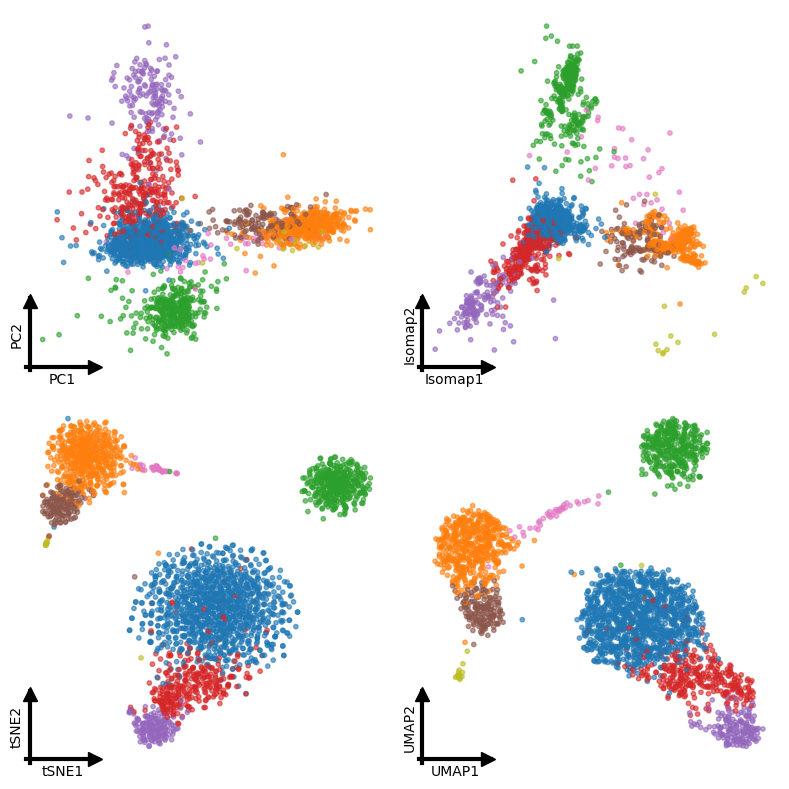

In [59]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

axs[0][0].scatter(*zip(*pbmc_pca[:,:2]), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[0][0].axis('off')
axs00_small = tiny_axes(axs[0][0], 'PC1', 'PC2')


axs[0][1].scatter(*zip(*pbmc_isomap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[0][1].axis('off')
axs01_small = tiny_axes(axs[0][1], 'Isomap1', 'Isomap2')

axs[1][0].scatter(*zip(*pbmc_tsne), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[1][0].axis('off')
axs10_small = tiny_axes(axs[1][0], 'tSNE1', 'tSNE2')

axs[1][1].scatter(*zip(*pbmc_umap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[1][1].axis('off')
axs11_small = tiny_axes(axs[1][1], 'UMAP1', 'UMAP2')

# fig.legend(handles=pbmc_h, labels=pbmc_l, loc='center left', bbox_to_anchor=(1,0.5), frameon=False, fontsize='large')

plt.tight_layout()
# plt.savefig('figures/Figure7A.png', bbox_inches='tight')
plt.show()

In [60]:
rng = np.random.default_rng(seed=42)
num_subsamples = 200
sample_size = 500

pbmc_subsamples = []
for _ in range(num_subsamples):
    ix = rng.choice(np.arange(len(pbmc_X)), sample_size)
    subsample = pbmc_X[ix].copy()
    pbmc_subsamples.append((ix, subsample))

In [61]:
len(set.union(*[set(ix) for ix, _ in pbmc_subsamples]))

2638

In [62]:
pbmc_pca_samples = np.empty(shape=(num_subsamples, len(pbmc_X), pca.n_components))
pbmc_pca_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(pbmc_subsamples)):
    ix, subsample = ix_subsample
    pbmc_pca_samples[i, ix] = pca.fit_transform(subsample)

200it [00:03, 59.05it/s]


In [63]:
pbmc_isomap_samples = np.empty(shape=(num_subsamples, len(pbmc_X), isomap.n_components))
pbmc_isomap_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(pbmc_subsamples)):
    ix, subsample = ix_subsample
    pbmc_isomap_samples[i, ix] = isomap.fit_transform(pbmc_pca_samples[i, ix])

200it [00:21,  9.43it/s]


In [64]:
pbmc_lem_samples = np.empty(shape=(num_subsamples, len(pbmc_X), lem.n_components))
pbmc_lem_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(pbmc_subsamples)):
    ix, subsample = ix_subsample
    pbmc_lem_samples[i, ix] = lem.fit_transform(pbmc_pca_samples[i, ix])

200it [00:08, 23.94it/s]


In [65]:
pbmc_tsne_samples = np.empty(shape=(num_subsamples, len(pbmc_X), tsne.n_components))
pbmc_tsne_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(pbmc_subsamples)):
    ix, subsample = ix_subsample
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        pbmc_tsne_samples[i, ix] = tsne.fit_transform(pbmc_pca_samples[i, ix])

200it [03:36,  1.08s/it]


In [66]:
pbmc_umap_samples = np.empty(shape=(num_subsamples, len(pbmc_X), umap.n_components))
pbmc_umap_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(pbmc_subsamples)):
    ix, subsample = ix_subsample
    pbmc_umap_samples[i, ix] = umap.fit_transform(pbmc_pca_samples[i, ix])

200it [06:16,  1.88s/it]


In [67]:
pbmc_gpa = GPA(centering=True, verbose=True)

In [68]:
%%time
pbmc_gpa.fit(pbmc_pca_samples[:,:,:2])
pbmc_rpca = pbmc_gpa.Z

iteration 1: loss = 0.926309
iteration 2: loss = 0.916545
iteration 3: loss = 0.915323
iteration 4: loss = 0.915166
iteration 5: loss = 0.915146
iteration 6: loss = 0.915143
iteration 7: loss = 0.915143
iteration 8: loss = 0.915143
iteration 9: loss = 0.915143
iteration 10: loss = 0.915143
iteration 11: loss = 0.915143
CPU times: user 3min 51s, sys: 12min 19s, total: 16min 10s
Wall time: 3min 31s


In [69]:
%%time
pbmc_gpa.fit(pbmc_isomap_samples)
pbmc_risomap = pbmc_gpa.Z

iteration 1: loss = 1.676025
iteration 2: loss = 1.674731
iteration 3: loss = 1.674729
iteration 4: loss = 1.674729
iteration 5: loss = 1.674729
CPU times: user 1min 37s, sys: 5min 21s, total: 6min 59s
Wall time: 1min 46s


In [70]:
%%time
pbmc_gpa.fit(pbmc_lem_samples)
pbmc_rlem = pbmc_gpa.Z

iteration 1: loss = 0.000476
iteration 2: loss = 0.000476
iteration 3: loss = 0.000476
CPU times: user 1min 6s, sys: 3min 32s, total: 4min 38s
Wall time: 1min 14s


In [71]:
%%time
pbmc_gpa.fit(pbmc_tsne_samples)
pbmc_rtsne = pbmc_gpa.Z

iteration 1: loss = 11.432750
iteration 2: loss = 11.043925
iteration 3: loss = 11.036875
iteration 4: loss = 11.036851
iteration 5: loss = 11.036851
iteration 6: loss = 11.036851
iteration 7: loss = 11.036851
CPU times: user 2min, sys: 6min 47s, total: 8min 48s
Wall time: 1min 55s


In [72]:
%%time
pbmc_gpa.fit(pbmc_umap_samples)
pbmc_rumap = pbmc_gpa.Z

iteration 1: loss = 1.744192
iteration 2: loss = 0.654004
iteration 3: loss = 0.455164
iteration 4: loss = 0.454263
iteration 5: loss = 0.454188
iteration 6: loss = 0.454187
iteration 7: loss = 0.454187
iteration 8: loss = 0.454187
iteration 9: loss = 0.454187
CPU times: user 2min 27s, sys: 8min 28s, total: 10min 55s
Wall time: 2min 15s


/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/713017977.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[0][0].scatter(*zip(*pbmc_rpca), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/713017977.py:9: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[0][1].scatter(*zip(*pbmc_risomap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/713017977.py:13: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[1][0].scatter(*zip(*pbmc_rtsne), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/713017977.py:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[1][1].scatter(*zip(*pbmc_rumap), c=pbmc_c, s

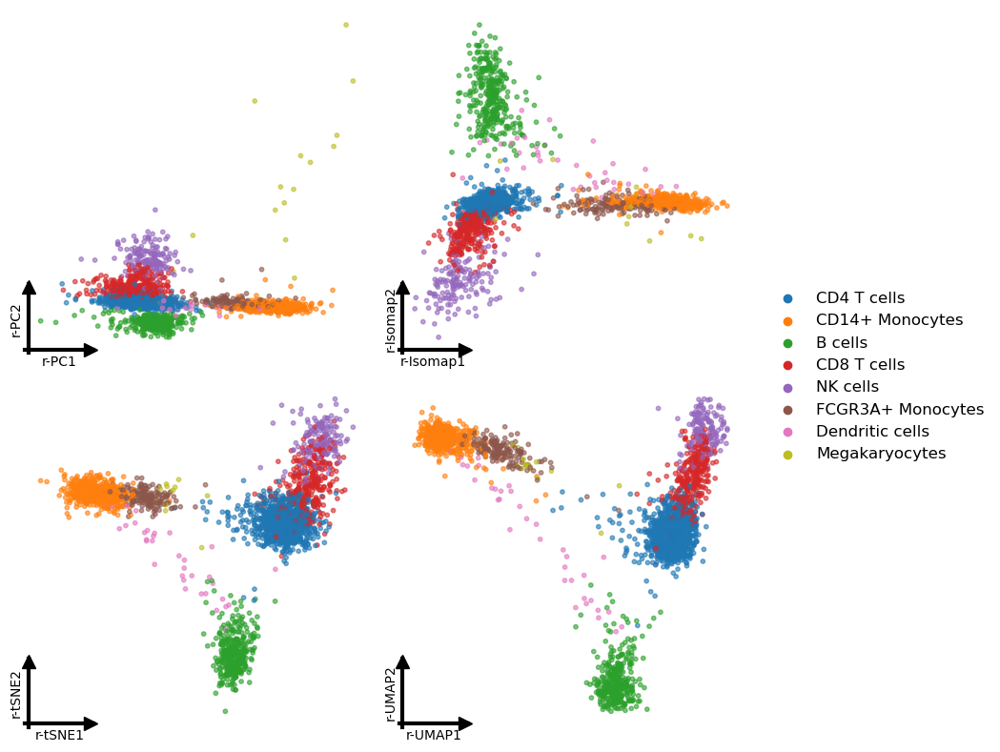

In [73]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

axs[0][0].scatter(*zip(*pbmc_rpca), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[0][0].axis('off')
#axs[0][0].set_yscale('symlog')
axs00_small = tiny_axes(axs[0][0], 'r-PC1', 'r-PC2')


axs[0][1].scatter(*zip(*pbmc_risomap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[0][1].axis('off')
axs01_small = tiny_axes(axs[0][1], 'r-Isomap1', 'r-Isomap2')

axs[1][0].scatter(*zip(*pbmc_rtsne), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[1][0].axis('off')
axs10_small = tiny_axes(axs[1][0], 'r-tSNE1', 'r-tSNE2')

axs[1][1].scatter(*zip(*pbmc_rumap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
axs[1][1].axis('off')
axs11_small = tiny_axes(axs[1][1], 'r-UMAP1', 'r-UMAP2')

fig.legend(handles=pbmc_h, labels=pbmc_l, loc='center left', bbox_to_anchor=(1,0.5), frameon=False, fontsize='large')

plt.tight_layout()
# plt.savefig('figures/Figure7B.png', bbox_inches='tight')
plt.show()

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1985346022.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*pbmc_rpca), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')


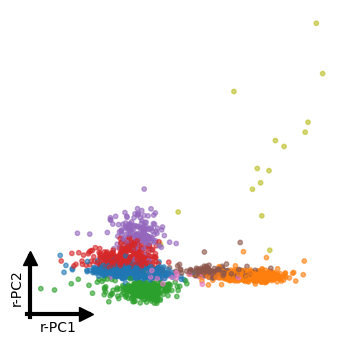

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1985346022.py:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*pbmc_risomap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')


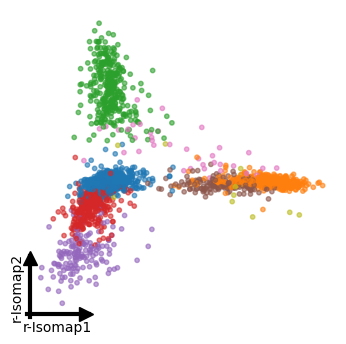

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1985346022.py:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*pbmc_rlem), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')


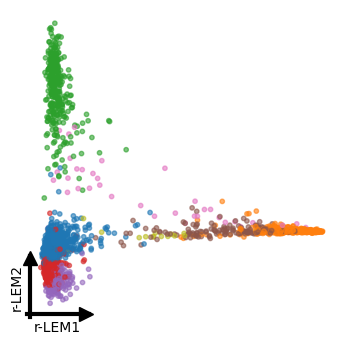

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1985346022.py:24: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*pbmc_rtsne), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')


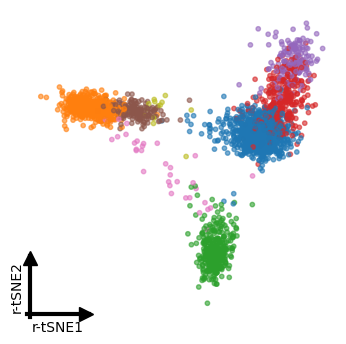

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1985346022.py:31: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*pbmc_rumap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')


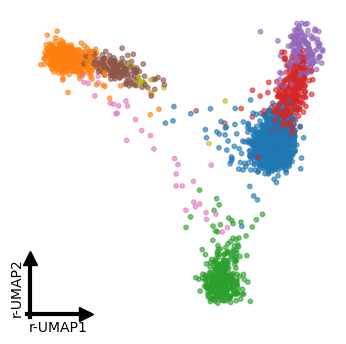

In [74]:
plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*pbmc_rpca), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-PC1', 'r-PC2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*pbmc_risomap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-Isomap1', 'r-Isomap2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*pbmc_rlem), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-LEM1', 'r-LEM2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*pbmc_rtsne), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-tSNE1', 'r-tSNE2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*pbmc_rumap), c=pbmc_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-UMAP1', 'r-UMAP2')
plt.show()

### Procrustes-MDS

In [75]:
%%time
pbmc_pca_procrustes_dist = list()
for x1, x2 in combinations(pbmc_pca_samples[:,:,:2], 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    pbmc_pca_procrustes_dist.append(d)
pbmc_pca_procrustes_dist = squareform(pbmc_pca_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
pbmc_pca_procrustes_mds = mds.fit_transform(pbmc_pca_procrustes_dist)

CPU times: user 6.73 s, sys: 292 ms, total: 7.03 s
Wall time: 5.83 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


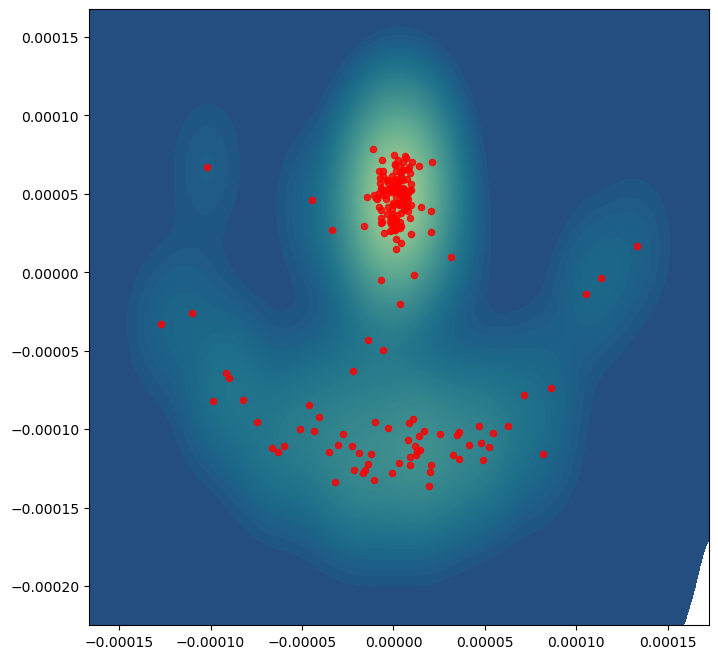

In [76]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=pbmc_pca_procrustes_mds[:,0], y=pbmc_pca_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*pbmc_pca_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [77]:
%%time
pbmc_isomap_procrustes_dist = list()
for x1, x2 in combinations(pbmc_isomap_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    pbmc_isomap_procrustes_dist.append(d)
pbmc_isomap_procrustes_dist = squareform(pbmc_isomap_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
pbmc_isomap_procrustes_mds = mds.fit_transform(pbmc_isomap_procrustes_dist)

CPU times: user 4.24 s, sys: 52 ms, total: 4.29 s
Wall time: 3.95 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


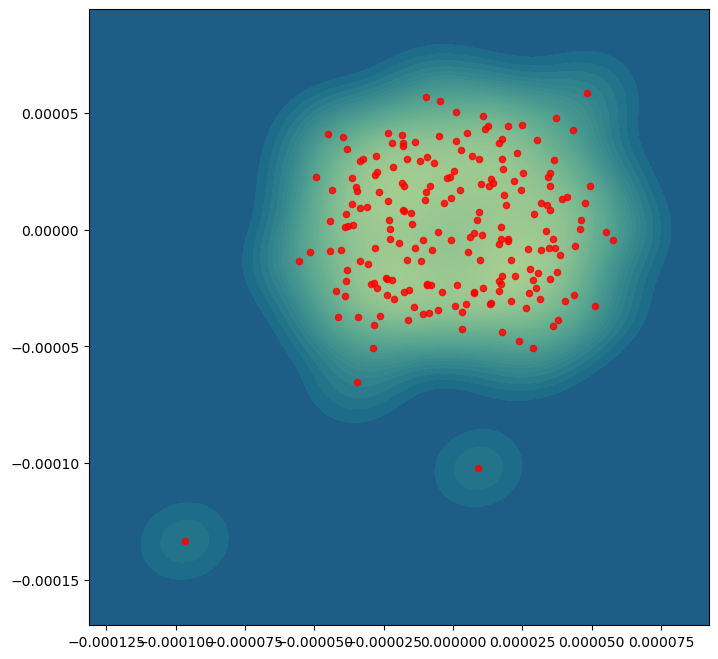

In [78]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=pbmc_isomap_procrustes_mds[:,0], y=pbmc_isomap_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*pbmc_isomap_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [79]:
%%time
pbmc_lem_procrustes_dist = list()
for x1, x2 in combinations(pbmc_lem_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    pbmc_lem_procrustes_dist.append(d)
pbmc_lem_procrustes_dist = squareform(pbmc_lem_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
pbmc_lem_procrustes_mds = mds.fit_transform(pbmc_lem_procrustes_dist)

CPU times: user 4.28 s, sys: 58.4 ms, total: 4.34 s
Wall time: 4.01 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


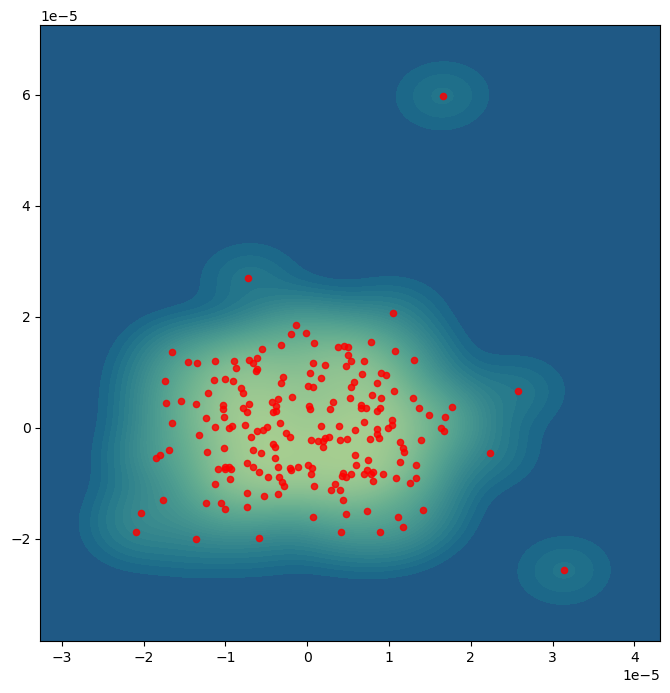

In [80]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=pbmc_lem_procrustes_mds[:,0], y=pbmc_lem_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*pbmc_lem_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [81]:
%%time
pbmc_tsne_procrustes_dist = list()
for x1, x2 in combinations(pbmc_tsne_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    pbmc_tsne_procrustes_dist.append(d)
pbmc_tsne_procrustes_dist = squareform(pbmc_tsne_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
pbmc_tsne_procrustes_mds = mds.fit_transform(pbmc_tsne_procrustes_dist)

CPU times: user 4.49 s, sys: 58.8 ms, total: 4.55 s
Wall time: 4.05 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


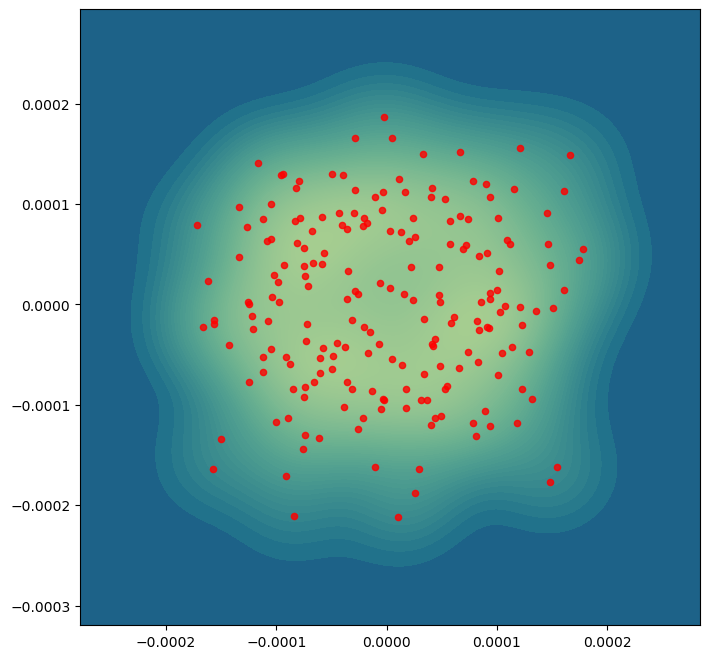

In [82]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=pbmc_tsne_procrustes_mds[:,0], y=pbmc_tsne_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*pbmc_tsne_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [83]:
%%time
pbmc_umap_procrustes_dist = list()
for x1, x2 in combinations(pbmc_umap_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    pbmc_umap_procrustes_dist.append(d)
pbmc_umap_procrustes_dist = squareform(pbmc_umap_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
pbmc_umap_procrustes_mds = mds.fit_transform(pbmc_umap_procrustes_dist)

CPU times: user 4.39 s, sys: 46.9 ms, total: 4.44 s
Wall time: 3.98 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


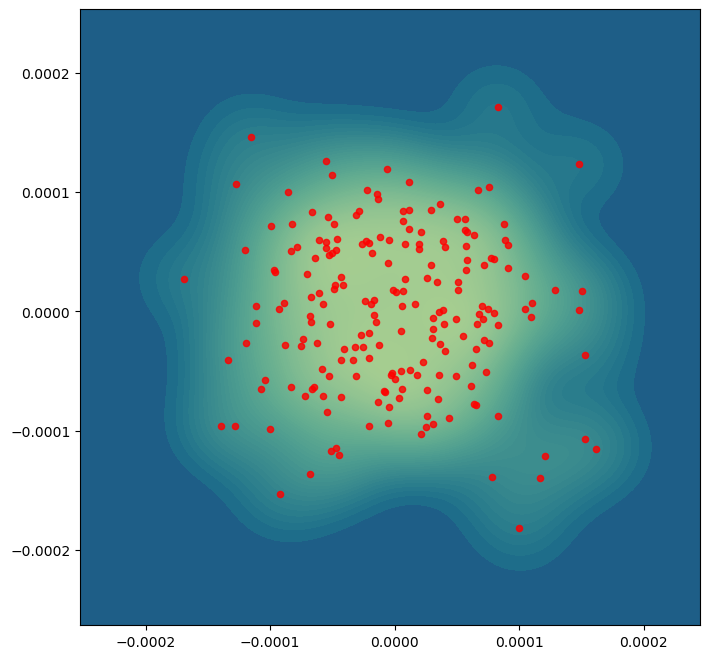

In [84]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=pbmc_umap_procrustes_mds[:,0], y=pbmc_umap_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*pbmc_umap_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [153]:
np.savez_compressed(
    '../results/pbmc_procrustes_dist.npz',
    pca = squareform(pbmc_pca_procrustes_dist),
    isomap = squareform(pbmc_isomap_procrustes_dist),
    lem = squareform(pbmc_lem_procrustes_dist),
    tsne = squareform(pbmc_tsne_procrustes_dist),
    umap = squareform(pbmc_umap_procrustes_dist)
)

### Impact

In [85]:
rng = np.random.default_rng(seed=42)
num_subsamples = 1000
sample_size = 500

pbmc_subsamples = []
for _ in range(num_subsamples):
    ix = rng.choice(np.arange(len(pbmc_X)), sample_size)
    subsample = pbmc_X[ix].copy()
    pbmc_subsamples.append((ix, subsample))

In [86]:
pca = PCA(n_components=50)

pbmc_pca_samples = np.empty(shape=(num_subsamples, len(pbmc_X), pca.n_components))
pbmc_pca_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(pbmc_subsamples)):
    ix, subsample = ix_subsample
    pbmc_pca_samples[i, ix] = pca.fit_transform(subsample)

1000it [00:16, 62.34it/s]


In [87]:
pbmc_rpca_old = pbmc_rpca.copy()

In [88]:
%%time
pbmc_gpa = GPA(centering=True, verbose=True)
pbmc_pca_fitted = pbmc_gpa.fit_transform(pbmc_pca_samples[:,:,:2])
pbmc_rpca = pbmc_gpa.Z

iteration 1: loss = 0.948921
iteration 2: loss = 0.939366
iteration 3: loss = 0.938289
iteration 4: loss = 0.938164
iteration 5: loss = 0.938150
iteration 6: loss = 0.938148
iteration 7: loss = 0.938148
iteration 8: loss = 0.938148
iteration 9: loss = 0.938148
iteration 10: loss = 0.938148
iteration 11: loss = 0.938148
CPU times: user 14min 15s, sys: 54min 15s, total: 1h 8min 31s
Wall time: 14min 48s


In [89]:
pbmc_subsamples_ix = pd.DataFrame(MultiLabelBinarizer(classes=np.arange(pbmc_X.shape[0])).fit_transform([ix for ix, _ in pbmc_subsamples]))
pbmc_subsamples_ix = pbmc_subsamples_ix.divide(pbmc_subsamples_ix.sum())

In [90]:
pbmc_adata.obs['impact'] = list(pbmc_subsamples_ix.T.dot(np.nanmean((pbmc_pca_fitted - pbmc_rpca) ** 2, axis=(1,2))))

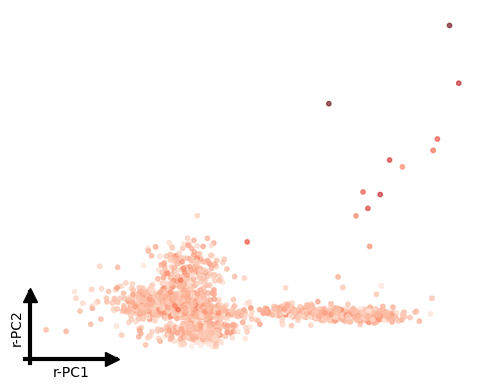

In [91]:
plt.figure(figsize=(5,4))
ax = plt.gca()
ax.scatter(*zip(*pbmc_rpca_old), c=pbmc_adata.obs['impact'], cmap='Reds', s=10, ec=None, alpha=0.6)
ax.axis('off')
ax_small = tiny_axes(ax, 'r-PC1', 'r-PC2')
plt.tight_layout()
# plt.savefig('figures/Figure7C.png', bbox_inches='tight')
plt.show()

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/3061815759.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=pbmc_adata.obs, x='louvain', y='impact', palette=pbmc_adata.uns['louvain_colors'], ax=ax)
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/3061815759.py:3: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.stripplot(data=pbmc_adata.obs, x='louvain', y='impact', palette=pbmc_adata.uns['louvain_colors'], ax=ax)


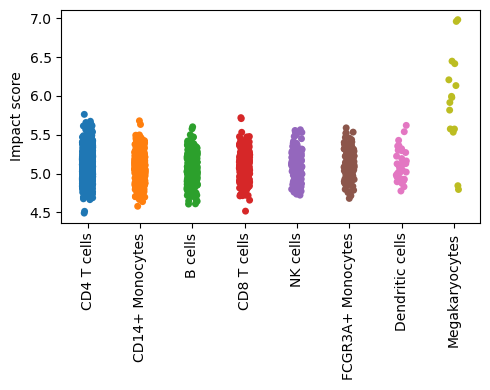

In [92]:
plt.figure(figsize=(5,4))
ax = plt.gca()
sns.stripplot(data=pbmc_adata.obs, x='louvain', y='impact', palette=pbmc_adata.uns['louvain_colors'], ax=ax)
ax.set_xlabel('')
ax.set_ylabel('Impact score')
ax.tick_params(axis='x', labelrotation=90)

plt.tight_layout()
# plt.savefig('figures/Figure7D.png', bbox_inches='tight')
plt.show()

/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tool

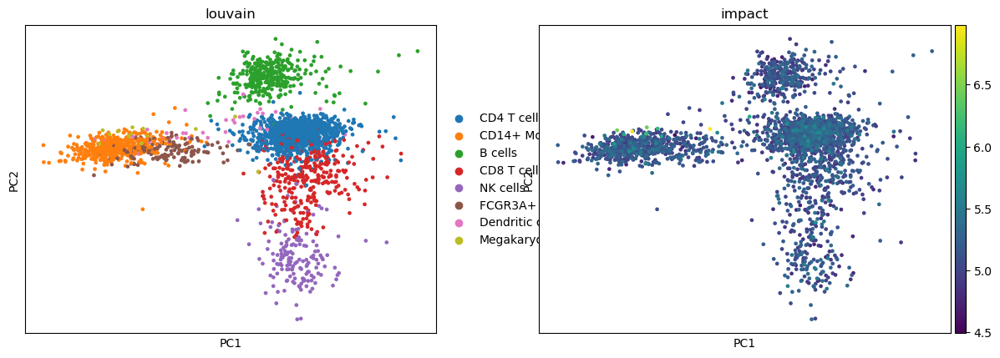

In [93]:
sc.pl.pca(pbmc_adata, color=['louvain', 'impact'])

In [94]:
pbmc_pca_dists = pd.DataFrame(squareform(pdist(pbmc_adata.obsm['X_pca'])), index=pbmc_adata.obs_names, columns=pbmc_adata.obs_names)

In [95]:
pbmc_adata.obs['eccentricity'] = pd.Series(np.linalg.norm(pbmc_pca_dists, ord=2, axis=0), index=pbmc_pca_dists.index)

/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


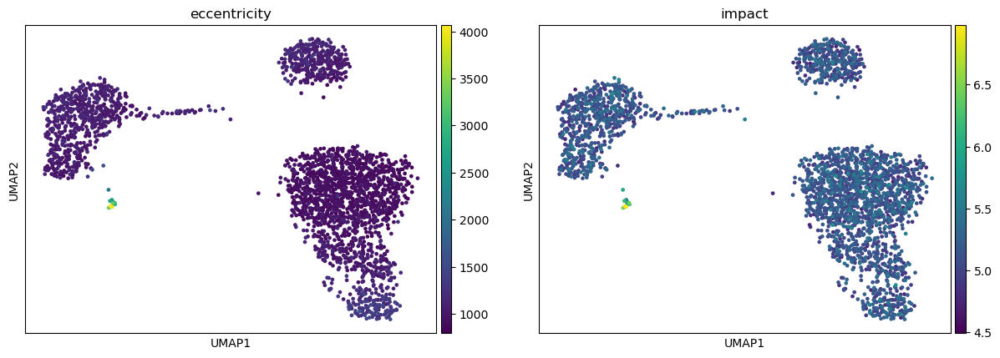

In [96]:
sc.pl.umap(pbmc_adata, color=['eccentricity', 'impact'])

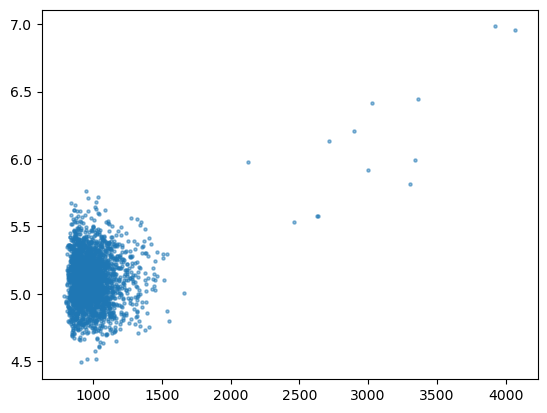

In [97]:
plt.scatter(pbmc_adata.obs['eccentricity'], pbmc_adata.obs['impact'], s=5, alpha=0.5)
plt.show()

In [98]:
pbmc_adata.obs['eccentricity'].corr(pbmc_adata.obs['impact'], method='spearman')

0.0026589192993461976

## Figure 8

In [99]:
tm_adata = sc.read_h5ad('../data/tabula_muris_brain_nonmyeloid.h5ad')

In [100]:
tm_adata

AnnData object with n_obs × n_vars = 7249 × 21069
    obs: 'FACS.selection', 'age', 'cell', 'free_annotation', 'method', 'donor_id', 'subtissue', 'n_genes', 'n_counts', 'louvain', 'leiden', 'assay_ontology_term_id', 'disease_ontology_term_id', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'sex_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: 'age_colors', 'leiden', 'louvain', 'neighbors', 'pca', 'schema_version', 'title'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [101]:
tm_adata = tm_adata[:, tm_adata.var.highly_variable]
sc.pp.scale(tm_adata, max_value=10)

/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:842: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


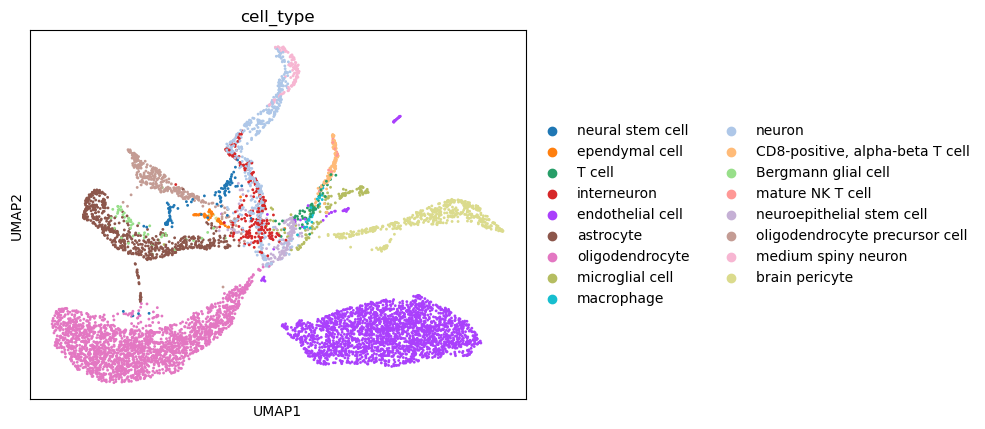

In [102]:
sc.pl.umap(tm_adata, color='cell_type')

In [103]:
tm_adata

AnnData object with n_obs × n_vars = 7249 × 4815
    obs: 'FACS.selection', 'age', 'cell', 'free_annotation', 'method', 'donor_id', 'subtissue', 'n_genes', 'n_counts', 'louvain', 'leiden', 'assay_ontology_term_id', 'disease_ontology_term_id', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'sex_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'mean', 'std'
    uns: 'age_colors', 'leiden', 'louvain', 'neighbors', 'pca', 'schema_version', 'title', 'cell_type_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [104]:
tm_X = tm_adata.X
tm_y = tm_adata.obs['cell_type']

In [105]:
tm_c = [dict(zip(tm_y.cat.categories, tm_adata.uns['cell_type_colors'])).get(y) for y in tm_y]

/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


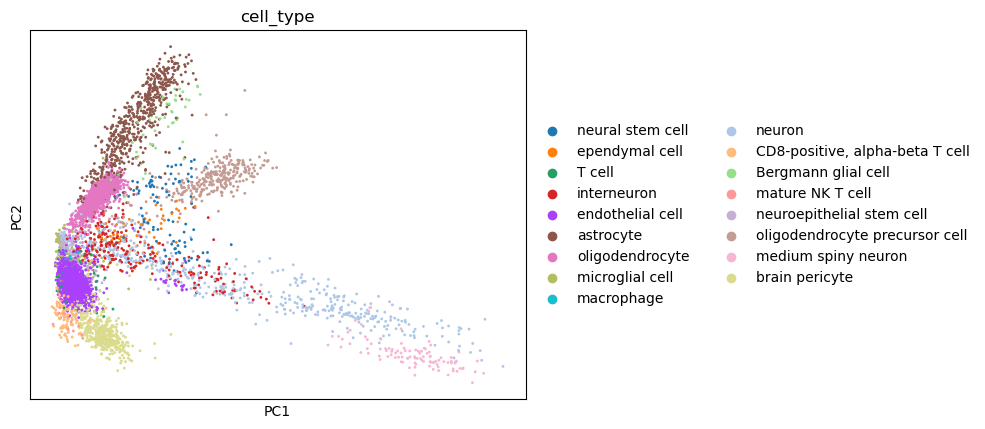

In [106]:
ax=plt.gca()
sc.pl.pca(tm_adata, color='cell_type', ax=ax)
tm_h, tm_l = ax.get_legend_handles_labels()

In [107]:
pca = PCA(n_components=50)
tm_pca = pca.fit_transform(tm_X)

In [108]:
isomap = Isomap(n_components=2, n_neighbors=15)
tm_isomap = isomap.fit_transform(tm_pca)

In [109]:
lem = SpectralEmbedding(n_components=2)
tm_lem = lem.fit_transform(tm_pca)

In [110]:
tsne = TSNE(n_components=2, perplexity=30, early_exaggeration=12, learning_rate=200)
tm_tsne = tsne.fit_transform(tm_pca)

In [111]:
umap = UMAP(n_components=2, min_dist=0.5, spread=1.0)
tm_umap = umap.fit_transform(tm_pca)

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/4151782310.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*tm_pca[:,:2]), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')


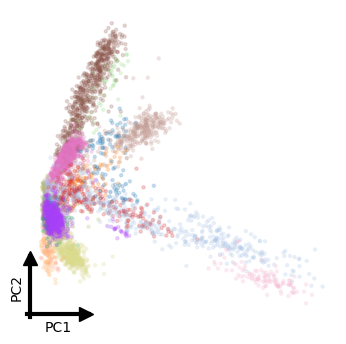

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/4151782310.py:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*tm_isomap), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')


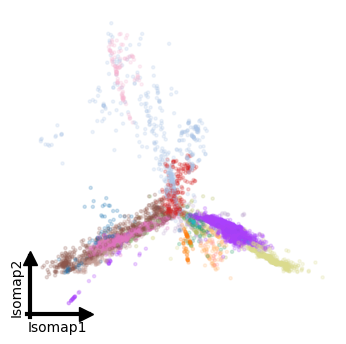

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/4151782310.py:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*tm_lem), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')


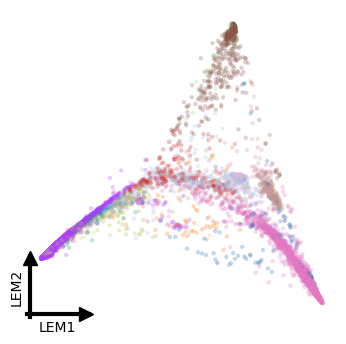

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/4151782310.py:24: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*tm_tsne), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')


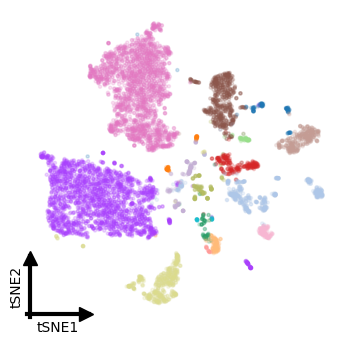

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/4151782310.py:31: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*tm_umap), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')


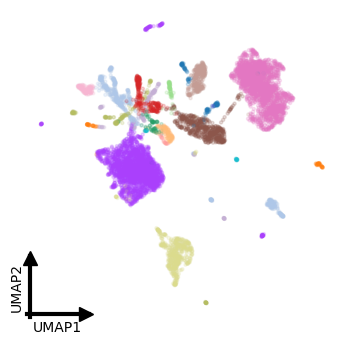

In [112]:
plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*tm_pca[:,:2]), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'PC1', 'PC2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*tm_isomap), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'Isomap1', 'Isomap2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*tm_lem), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'LEM1', 'LEM2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*tm_tsne), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'tSNE1', 'tSNE2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*tm_umap), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'UMAP1', 'UMAP2')
plt.show()

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/477653874.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[0][0].scatter(*zip(*tm_pca[:,:2]), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/477653874.py:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[0][1].scatter(*zip(*tm_isomap), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/477653874.py:12: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[1][0].scatter(*zip(*tm_tsne), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/477653874.py:16: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[1][1].scatter(*zip(*tm_umap), c=tm_c, s=5, ec=None, alph

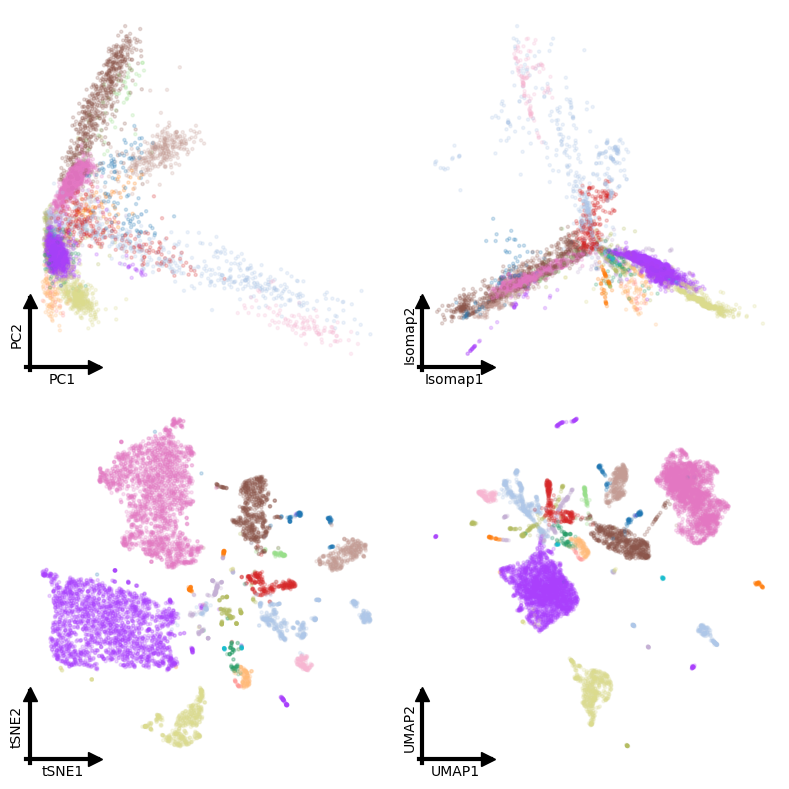

In [113]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

axs[0][0].scatter(*zip(*tm_pca[:,:2]), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
axs[0][0].axis('off')
axs00_small = tiny_axes(axs[0][0], 'PC1', 'PC2')


axs[0][1].scatter(*zip(*tm_isomap), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
axs[0][1].axis('off')
axs01_small = tiny_axes(axs[0][1], 'Isomap1', 'Isomap2')

axs[1][0].scatter(*zip(*tm_tsne), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
axs[1][0].axis('off')
axs10_small = tiny_axes(axs[1][0], 'tSNE1', 'tSNE2')

axs[1][1].scatter(*zip(*tm_umap), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
axs[1][1].axis('off')
axs11_small = tiny_axes(axs[1][1], 'UMAP1', 'UMAP2')

# fig.legend(handles=tm_h, labels=tm_l, loc='center left', bbox_to_anchor=(1,0.5), frameon=False, fontsize='large')

plt.tight_layout()
# plt.savefig('figures/Figure8A.png', bbox_inches='tight')
plt.show()

In [114]:
rng = np.random.default_rng(seed=42)
num_subsamples = 100 # crashes when = 200
sample_size = 1000

tm_subsamples = []
for _ in range(num_subsamples):
    ix = rng.choice(np.arange(len(tm_X)), sample_size)
    subsample = tm_X[ix].copy()
    tm_subsamples.append((ix, subsample))

In [115]:
len(set.union(*[set(ix) for ix, _ in tm_subsamples]))

7249

In [116]:
tm_pca_samples = np.empty(shape=(num_subsamples, len(tm_X), pca.n_components))
tm_pca_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(tm_subsamples)):
    ix, subsample = ix_subsample
    tm_pca_samples[i, ix] = pca.fit_transform(subsample)

100it [00:09, 10.97it/s]


In [117]:
tm_isomap_samples = np.empty(shape=(num_subsamples, len(tm_X), isomap.n_components))
tm_isomap_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(tm_subsamples)):
    ix, subsample = ix_subsample
    tm_isomap_samples[i, ix] = isomap.fit_transform(tm_pca_samples[i, ix])

100it [00:42,  2.36it/s]


In [118]:
tm_lem_samples = np.empty(shape=(num_subsamples, len(tm_X), lem.n_components))
tm_lem_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(tm_subsamples)):
    ix, subsample = ix_subsample
    tm_lem_samples[i, ix] = lem.fit_transform(tm_pca_samples[i, ix])

100it [00:14,  6.67it/s]


In [119]:
tm_tsne_samples = np.empty(shape=(num_subsamples, len(tm_X), tsne.n_components))
tm_tsne_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(tm_subsamples)):
    ix, subsample = ix_subsample
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        tm_tsne_samples[i, ix] = tsne.fit_transform(tm_pca_samples[i, ix])

100it [03:32,  2.12s/it]


In [120]:
tm_umap_samples = np.empty(shape=(num_subsamples, len(tm_X), umap.n_components))
tm_umap_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(tm_subsamples)):
    ix, subsample = ix_subsample
    tm_umap_samples[i, ix] = umap.fit_transform(tm_pca_samples[i, ix])

100it [03:53,  2.33s/it]


In [121]:
tm_gpa = GPA(centering=True, verbose=True)

In [122]:
%%time
tm_gpa.fit(tm_pca_samples[:,:,:2])
tm_rpca = tm_gpa.Z

iteration 1: loss = 1.352193
iteration 2: loss = 1.049757
iteration 3: loss = 0.979832
iteration 4: loss = 0.979635
iteration 5: loss = 0.979634
iteration 6: loss = 0.979634
iteration 7: loss = 0.979634
iteration 8: loss = 0.979634
CPU times: user 12min 24s, sys: 22min 59s, total: 35min 24s
Wall time: 9min 10s


In [123]:
%%time
tm_gpa.fit(tm_isomap_samples)
tm_risomap = tm_gpa.Z

iteration 1: loss = 3.722547
iteration 2: loss = 3.711558
iteration 3: loss = 3.711444
iteration 4: loss = 3.711443
iteration 5: loss = 3.711443
iteration 6: loss = 3.711443
iteration 7: loss = 3.711443
CPU times: user 7min 47s, sys: 15min 30s, total: 23min 17s
Wall time: 6min 22s


In [124]:
%%time
tm_gpa.fit(tm_lem_samples)
tm_rlem = tm_gpa.Z

iteration 1: loss = 0.000200
iteration 2: loss = 0.000199
iteration 3: loss = 0.000199
iteration 4: loss = 0.000199
CPU times: user 5min 8s, sys: 9min 55s, total: 15min 3s
Wall time: 4min 39s


In [125]:
%%time
tm_gpa.fit(tm_tsne_samples)
tm_rtsne = tm_gpa.Z

iteration 1: loss = 3.936711
iteration 2: loss = 3.377192
iteration 3: loss = 3.370883
iteration 4: loss = 3.370817
iteration 5: loss = 3.370817
iteration 6: loss = 3.370816
iteration 7: loss = 3.370816
iteration 8: loss = 3.370816
CPU times: user 8min 35s, sys: 17min 18s, total: 25min 54s
Wall time: 6min 34s


In [126]:
%%time
tm_gpa.fit(tm_umap_samples)
tm_rumap = tm_gpa.Z

iteration 1: loss = 2.140622
iteration 2: loss = 1.376063
iteration 3: loss = 0.613518
iteration 4: loss = 0.606491
iteration 5: loss = 0.606343
iteration 6: loss = 0.606338
iteration 7: loss = 0.606338
iteration 8: loss = 0.606338
iteration 9: loss = 0.606338
CPU times: user 9min 24s, sys: 18min 55s, total: 28min 19s
Wall time: 6min 57s


/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/3003369780.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[0][0].scatter(*zip(*tm_rpca), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/3003369780.py:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[0][1].scatter(*zip(*tm_risomap), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/3003369780.py:12: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[1][0].scatter(*zip(*tm_rtsne), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/3003369780.py:16: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[1][1].scatter(*zip(*tm_rumap), c=tm_c, s=5, ec=None, al

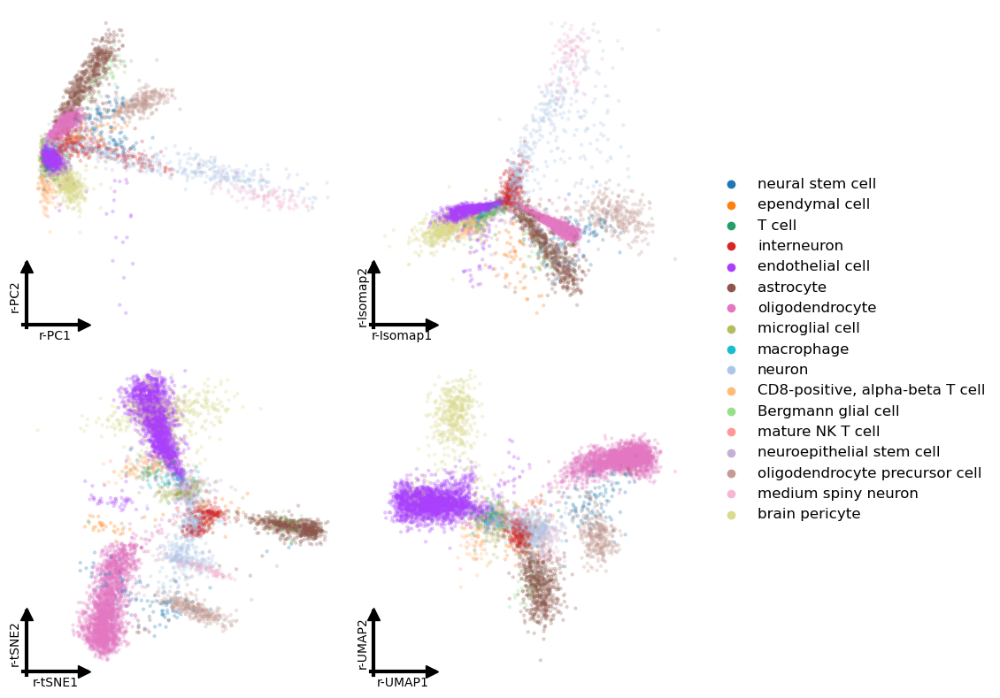

In [127]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

axs[0][0].scatter(*zip(*tm_rpca), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
axs[0][0].axis('off')
axs00_small = tiny_axes(axs[0][0], 'r-PC1', 'r-PC2')


axs[0][1].scatter(*zip(*tm_risomap), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
axs[0][1].axis('off')
axs01_small = tiny_axes(axs[0][1], 'r-Isomap1', 'r-Isomap2')

axs[1][0].scatter(*zip(*tm_rtsne), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
axs[1][0].axis('off')
axs10_small = tiny_axes(axs[1][0], 'r-tSNE1', 'r-tSNE2')

axs[1][1].scatter(*zip(*tm_rumap), c=tm_c, s=5, ec=None, alpha=0.2, cmap='tab10')
axs[1][1].axis('off')
axs11_small = tiny_axes(axs[1][1], 'r-UMAP1', 'r-UMAP2')

fig.legend(handles=tm_h, labels=tm_l, loc='center left', bbox_to_anchor=(1,0.5), frameon=False, fontsize='large')

plt.tight_layout()
# plt.savefig('figures/Figure8B.png', bbox_inches='tight')
plt.show()

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1689229966.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*tm_rpca), c=tm_c, s=10, ec=None, alpha=0.6, cmap='tab10')


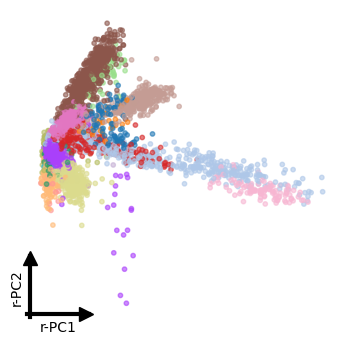

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1689229966.py:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*tm_risomap), c=tm_c, s=10, ec=None, alpha=0.6, cmap='tab10')


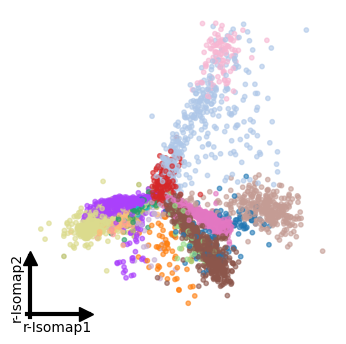

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1689229966.py:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*tm_rlem), c=tm_c, s=10, ec=None, alpha=0.6, cmap='tab10')


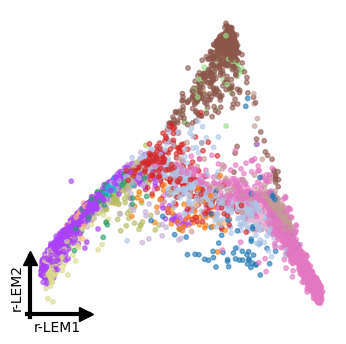

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1689229966.py:24: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*tm_rtsne), c=tm_c, s=10, ec=None, alpha=0.6, cmap='tab10')


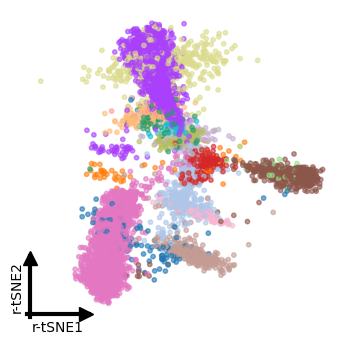

/var/folders/r9/13bx_vn958b3mvd7s7n9pzjr0000gp/T/ipykernel_2616/1689229966.py:31: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(*zip(*tm_rumap), c=tm_c, s=10, ec=None, alpha=0.6, cmap='tab10')


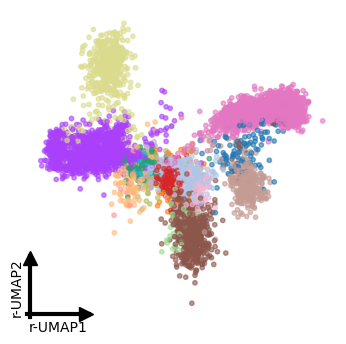

In [128]:
plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*tm_rpca), c=tm_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-PC1', 'r-PC2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*tm_risomap), c=tm_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-Isomap1', 'r-Isomap2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*tm_rlem), c=tm_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-LEM1', 'r-LEM2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*tm_rtsne), c=tm_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-tSNE1', 'r-tSNE2')
plt.show()

plt.figure(figsize=(4,4))
ax = plt.gca()
ax.scatter(*zip(*tm_rumap), c=tm_c, s=10, ec=None, alpha=0.6, cmap='tab10')
ax.axis('off')
ax_small = tiny_axes(ax, 'r-UMAP1', 'r-UMAP2')
plt.show()

### Procrustes-MDS

In [129]:
%%time
tm_pca_procrustes_dist = list()
for x1, x2 in combinations(tm_pca_samples[:,:,:2], 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    tm_pca_procrustes_dist.append(d)
tm_pca_procrustes_dist = squareform(tm_pca_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
tm_pca_procrustes_mds = mds.fit_transform(tm_pca_procrustes_dist)

CPU times: user 2.83 s, sys: 299 ms, total: 3.13 s
Wall time: 3.36 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


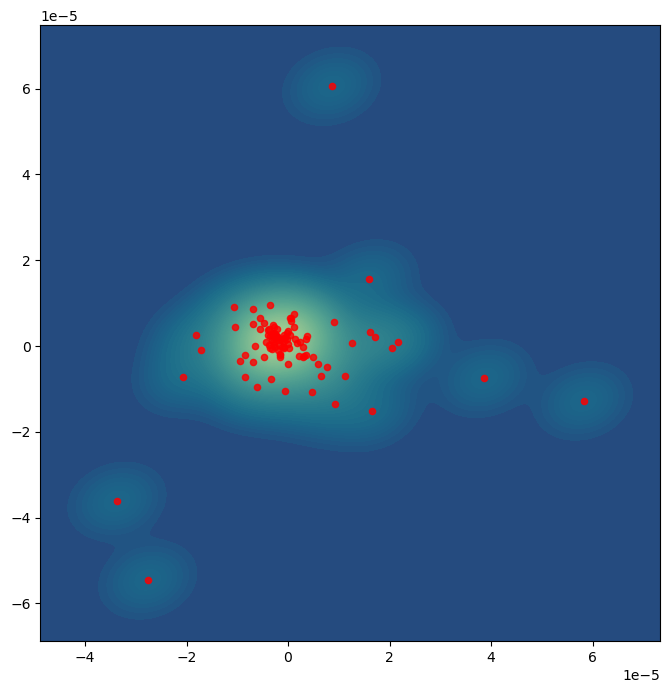

In [130]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=tm_pca_procrustes_mds[:,0], y=tm_pca_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*tm_pca_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [131]:
%%time
tm_isomap_procrustes_dist = list()
for x1, x2 in combinations(tm_isomap_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    tm_isomap_procrustes_dist.append(d)
tm_isomap_procrustes_dist = squareform(tm_isomap_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
tm_isomap_procrustes_mds = mds.fit_transform(tm_isomap_procrustes_dist)

CPU times: user 2.22 s, sys: 44.6 ms, total: 2.26 s
Wall time: 1.64 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


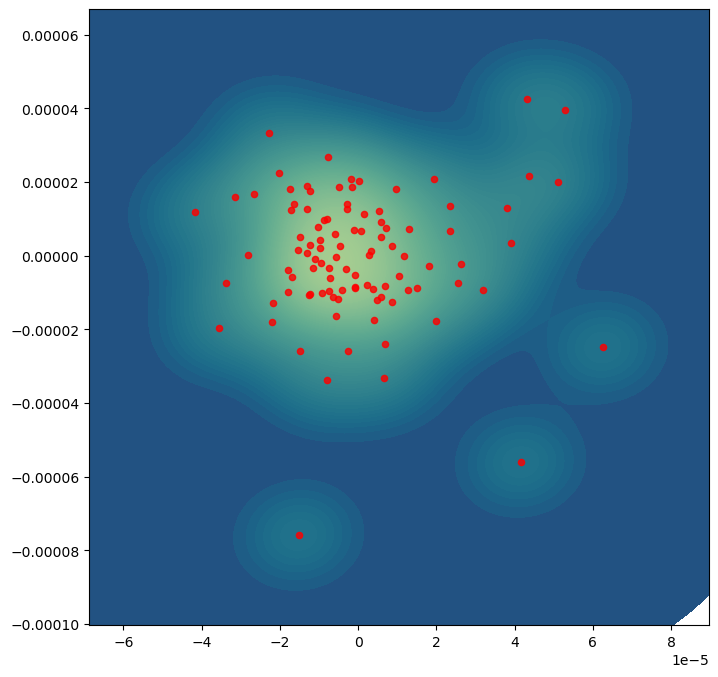

In [132]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=tm_isomap_procrustes_mds[:,0], y=tm_isomap_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*tm_isomap_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [133]:
%%time
tm_lem_procrustes_dist = list()
for x1, x2 in combinations(tm_lem_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    tm_lem_procrustes_dist.append(d)
tm_lem_procrustes_dist = squareform(tm_lem_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
tm_lem_procrustes_mds = mds.fit_transform(tm_lem_procrustes_dist)

CPU times: user 1.83 s, sys: 37 ms, total: 1.87 s
Wall time: 1.64 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


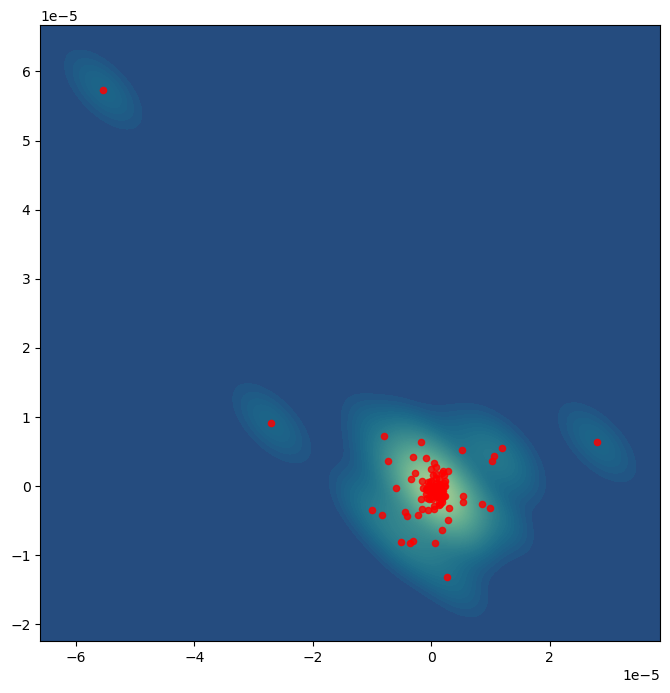

In [134]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=tm_lem_procrustes_mds[:,0], y=tm_lem_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*tm_lem_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [135]:
%%time
tm_tsne_procrustes_dist = list()
for x1, x2 in combinations(tm_tsne_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    tm_tsne_procrustes_dist.append(d)
tm_tsne_procrustes_dist = squareform(tm_tsne_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
tm_tsne_procrustes_mds = mds.fit_transform(tm_tsne_procrustes_dist)

CPU times: user 2.03 s, sys: 64.8 ms, total: 2.1 s
Wall time: 1.49 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


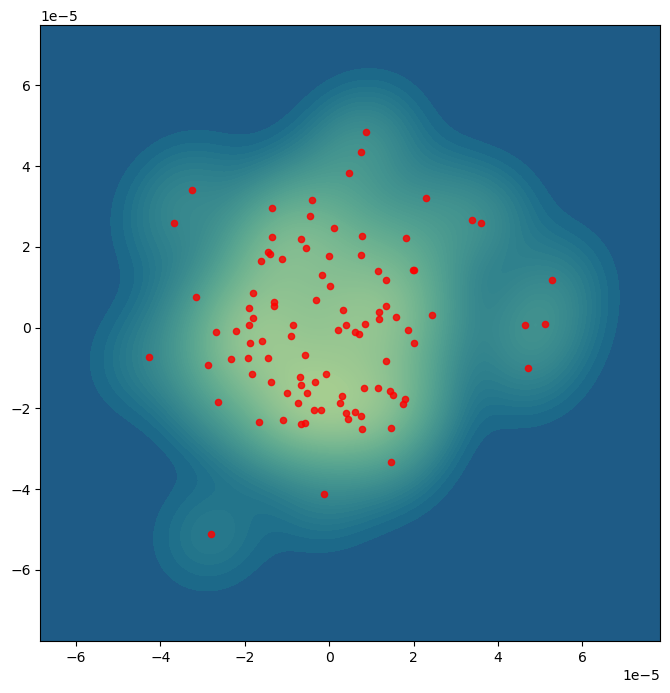

In [136]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=tm_tsne_procrustes_mds[:,0], y=tm_tsne_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*tm_tsne_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [137]:
%%time
tm_umap_procrustes_dist = list()
for x1, x2 in combinations(tm_umap_samples, 2):
    ix1 = ~np.any(np.isnan(x1), axis=1)
    ix2 = ~np.any(np.isnan(x2), axis=1)
    ix_common = ix1 & ix2
    if len(ix_common) == 0:
        print('No overlap.')
        d = np.nan
    else:
        d = procrustes(x1[ix_common, :], x2[ix_common, :])[2] / len(ix_common)
    tm_umap_procrustes_dist.append(d)
tm_umap_procrustes_dist = squareform(tm_umap_procrustes_dist)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
tm_umap_procrustes_mds = mds.fit_transform(tm_umap_procrustes_dist)

CPU times: user 1.86 s, sys: 36.1 ms, total: 1.9 s
Wall time: 1.52 s


/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


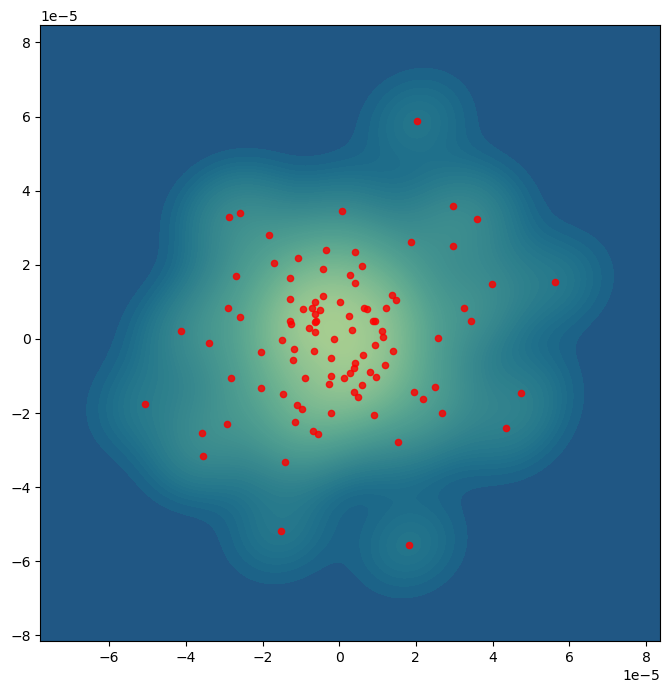

In [138]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
g = sns.kdeplot(x=tm_umap_procrustes_mds[:,0], y=tm_umap_procrustes_mds[:,1], ax=ax, cmap='crest_r', fill=True, levels=100, thresh=-0, norm=PowerNorm(gamma=0.3))
ax.scatter(*zip(*tm_umap_procrustes_mds), s=20, alpha=0.8, c='red')

# ax.axis('off')
plt.show()

In [154]:
np.savez_compressed(
    '../results/tm_procrustes_dist.npz',
    pca = squareform(tm_pca_procrustes_dist),
    isomap = squareform(tm_isomap_procrustes_dist),
    lem = squareform(tm_lem_procrustes_dist),
    tsne = squareform(tm_tsne_procrustes_dist),
    umap = squareform(tm_umap_procrustes_dist)
)

### Impact

In [139]:
rng = np.random.default_rng(seed=42)
num_subsamples = 100
sample_size = 1000

tm_subsamples = []
for _ in range(num_subsamples):
    ix = rng.choice(np.arange(len(tm_X)), sample_size)
    subsample = tm_X[ix].copy()
    tm_subsamples.append((ix, subsample))

In [140]:
pca = PCA(n_components=50)

tm_pca_samples = np.empty(shape=(num_subsamples, len(tm_X), pca.n_components))
tm_pca_samples[:] = np.nan
for i, ix_subsample in tqdm(enumerate(tm_subsamples)):
    ix, subsample = ix_subsample
    tm_pca_samples[i, ix] = pca.fit_transform(subsample)

100it [00:08, 12.17it/s]


In [141]:
%%time
tm_gpa = GPA(centering=True, verbose=True)
tm_pca_fitted = tm_gpa.fit_transform(tm_pca_samples[:,:,:2])
tm_rpca = tm_gpa.Z

iteration 1: loss = 1.352194
iteration 2: loss = 1.049758
iteration 3: loss = 0.979833
iteration 4: loss = 0.979637
iteration 5: loss = 0.979635
iteration 6: loss = 0.979635
iteration 7: loss = 0.979635
iteration 8: loss = 0.979635
CPU times: user 8min 35s, sys: 17min 8s, total: 25min 43s
Wall time: 6min 37s


In [142]:
tm_subsamples_ix = pd.DataFrame(MultiLabelBinarizer(classes=np.arange(tm_X.shape[0])).fit_transform([ix for ix, _ in tm_subsamples]))
tm_subsamples_ix = tm_subsamples_ix.divide(tm_subsamples_ix.sum())

In [143]:
tm_adata.obs['impact'] = list(tm_subsamples_ix.T.dot(np.nanmean((tm_pca_fitted - tm_rpca) ** 2, axis=(1,2))))

/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tool

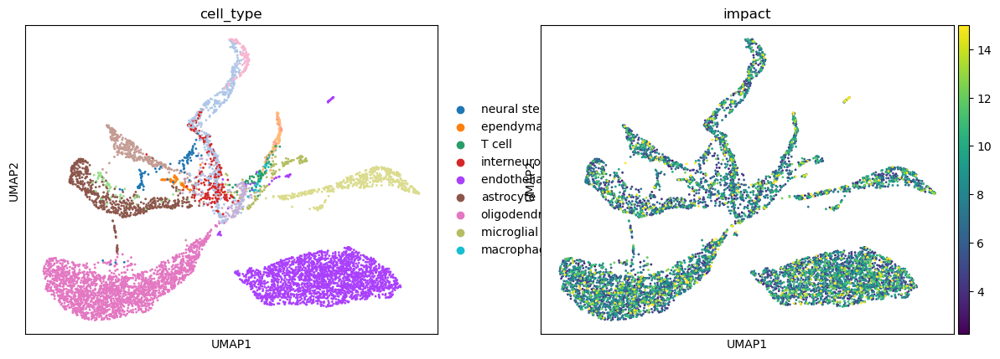

In [144]:
sc.pl.umap(tm_adata, color=['cell_type', 'impact'], vmax=15)

In [145]:
tm_pca_dists = pd.DataFrame(squareform(pdist(tm_adata.obsm['X_pca'])), index=tm_adata.obs_names, columns=tm_adata.obs_names)

In [146]:
tm_adata.obs['eccentricity'] = pd.Series(np.linalg.norm(tm_pca_dists, ord=2, axis=0), index=tm_pca_dists.index)

/opt/anaconda3/envs/scanpy-ripser-env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


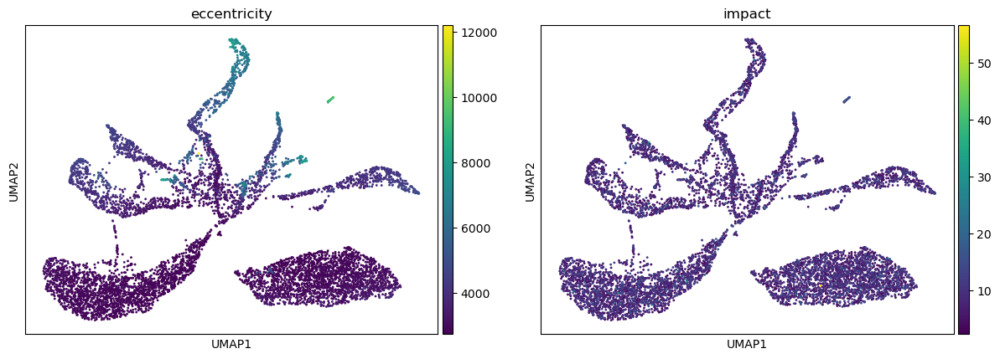

In [147]:
sc.pl.umap(tm_adata, color=['eccentricity', 'impact'])

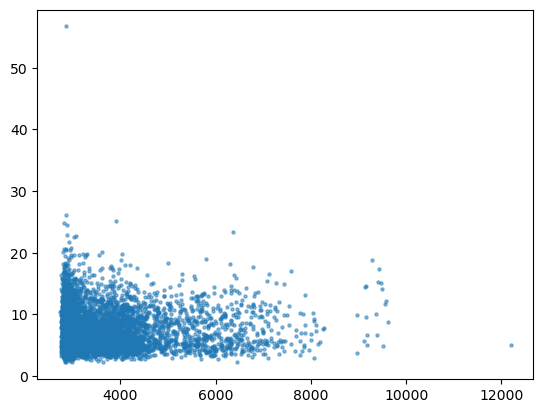

In [148]:
plt.scatter(tm_adata.obs['eccentricity'], tm_adata.obs['impact'], s=5, alpha=0.5)
plt.show()

In [149]:
tm_adata.obs['eccentricity'].corr(tm_adata.obs['impact'], method='spearman')

-0.0006732049346617913